# Tests

In [1]:
%display latex
import sys

sys.path.insert(0, "/home/twright/Documents/PhD/Notebooks")

from contextlib import contextmanager
import sys, os

@contextmanager
def suppress_stdout():
    with open(os.devnull, "w") as devnull:
        old_stdout = sys.stdout
        sys.stdout = devnull
        try:  
            yield
        finally:
            sys.stdout = old_stdout
            
            
import warnings
            
@contextmanager
def suppress_warnings():
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        yield

## Example 1: Simple

In [2]:
from flowstar.reachability import Reach
from flowstar.poly import Poly
from lbuc import *

In [3]:
R.<x,y> = RIF[]

In [4]:
system = System(
    R,
    (x,y),
    [(4,5), (1,2)],
    [
        -y,
        x,
    ],
)

In [5]:
system.y

(-y, x)

In [6]:
def mval(x, y):
    val = RIF((var("x")^2 + var("y")^2)({var("x"): x, var("y"): y}))
    if val.upper() < 4:
        return 1
    elif val.lower() > 4:
        return -1
    else:
        return 0

In [7]:
from matplotlib.colors import LinearSegmentedColormap

In [8]:
def f(m):
    return 3*((m + 1)/2)


def finv(m):
    return 2*m/3 - 1

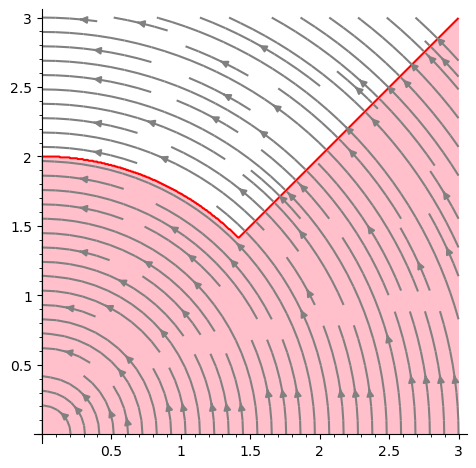

In [9]:
p = streamline_plot(tuple(system.y),(x,0,3),(y,0,3), color='grey')\
    + region_plot((lambda x, y: x^2 + y^2 < 4 or x > y),
                  (x, 0, 3),
                  (y, 0, 3),
                  incol='pink', plot_points=500, bordercol='red')
p.set_aspect_ratio(1)
p.show()

In [10]:
reach = system.with_y0([RIF(0, 3), RIF(0, 3)]).reach(2*pi,
    step=0.8, order=10, estimation=1e-5, cutoff_threshold=1e-10,
    precompose_taylor_models=True,
    unpreconditioning_order=3,
)

In [11]:
reach.res

2

In [12]:
def rval(t0, x, y, symbolic_composition=False, symbolic_composition_order=4):
    #print(f"x = {x.str(style='brackets')}; y = {y.str(style='brackets')}")
    x = finv(x)
    y = finv(y)
    #print(f"x' = {x.str(style='brackets')}; y' = {y.str(style='brackets')}")
    with suppress_stdout():
        obs = PolyObserver(R(4 - var("x")^2 - var("y")^2), reach,
                           symbolic_composition=symbolic_composition,
                           symbolic_composition_order=symbolic_composition_order)
        robs = RestrictedObserver(obs, [x, y])
        res = robs(t0)
    if res.lower() > 0:
        return 1
    elif res.upper() < 0:
        return -1
    else:
        return 0

In [13]:
import time

@interact
def _(N=slider(1,10, step_size=1, default=1), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False),
      symbolic_composition_order=input_box(4),
      auto_update=False):
    t1 = time.perf_counter()
    colors = ['pink', 'white', 'lightgreen']
    cm = LinearSegmentedColormap.from_list('ternary colors', colors, N=3)
    n = 2**N
    step = 3 / n
    step_lim = 3/max(n, 8)
    from matplotlib import ticker
    ticks = srange(-0.5, n, n/min(n, 8), include_endpoint=True)
    gridlines = srange(0.5, n-0.5, 1)
    tick_formatter = ticker.FuncFormatter(lambda k, _: '{0:.2f}'.format(
        -1 + 2 * (k + 0.5) / n))
    res = matrix_plot(Matrix([[rval(t0*pi, RIF(x, x+step),RIF(y, y+step), symbolic_composition=symbolic_composition, symbolic_composition_order=int(symbolic_composition_order)) for x in srange(0, 3, step)] for y in srange(0, 3, step)]), cmap=cm, tick_formatter=(tick_formatter, tick_formatter), ticks=(ticks, ticks), gridlines=(gridlines, gridlines), origin='lower')
    print(f"ran in {time.perf_counter() - t1} sec")
    return res

Manual interactive function <function _ at 0x7f1b4e0c4280> with 4 widgets
  N: TransformIntSlider(value=1, des…

In [14]:
def rval2(t0, x, y, symbolic_composition=False):
    print(f"x = {x.str(style='brackets')}; y = {y.str(style='brackets')}")
    x = finv(x)
    y = finv(y)
    print(f"x' = {x.str(style='brackets')}; y' = {y.str(style='brackets')}")
    with suppress_stdout():
        obs = PolyObserver(R(4 - var("x")^2 - var("y")^2), reach, symbolic_composition=symbolic_composition)
        robs = RestrictedObserver(obs, [x, y])
        res = robs.check(t0)
        
    return {
        True: 1,
        None: 0,
        False: -1,
    }[res]

In [15]:
@interact
def _(N=slider(1,10, step_size=1, default=1), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), auto_update=False):
    colors = ['pink', 'white', 'lightgreen']
    cm = LinearSegmentedColormap.from_list('ternary colors', colors, N=3)
    n = 2**N
    step = 3 / n
    step_lim = 3/max(n, 8)
    from matplotlib import ticker
    ticks = srange(-0.5, n, n/min(n, 8), include_endpoint=True)
    gridlines = srange(0.5, n-0.5, 1)
    tick_formatter = ticker.FuncFormatter(lambda k, _: '{0:.2f}'.format(
        -1 + 2 * (k + 0.5) / n))
    return matrix_plot(Matrix([[rval2(t0*pi, RIF(x, x+step),RIF(y, y+step), symbolic_composition=symbolic_composition) for x in srange(0, 3, step)] for y in srange(0, 3, step)]), cmap=cm, tick_formatter=(tick_formatter, tick_formatter), ticks=(ticks, ticks), gridlines=(gridlines, gridlines), origin='lower')

Manual interactive function <function _ at 0x7f1b39245790> with 3 widgets
  N: TransformIntSlider(value=1, des…

In [16]:
def rval3(t0, x, y, symbolic_composition=False):
    print(f"x = {x.str(style='brackets')}; y = {y.str(style='brackets')}")
    with suppress_stdout():
        rch = system.with_y0([x, y]).reach(2*pi, step=0.8, order=15, estimation=1e-5, cutoff_threshold=1e-10, precompose_taylor_models=True, symbolic_composition=symbolic_composition)
        obs = PolyObserver(R(4 - var("x")^2 - var("y")^2), rch, symbolic_composition=symbolic_composition)
        res = obs.check(t0)
        
    return {
        True: 1,
        None: 0,
        False: -1,
    }[res]

In [17]:
@interact
def _(N=slider(1,10, step_size=1, default=1), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), auto_update=False):
    colors = ['pink', 'white', 'lightgreen']
    cm = LinearSegmentedColormap.from_list('ternary colors', colors, N=3)
    n = 2**N
    step = 3 / n
    step_lim = 3/max(n, 8)
    from matplotlib import ticker
    ticks = srange(-0.5, n, n/min(n, 8), include_endpoint=True)
    gridlines = srange(0.5, n-0.5, 1)
    tick_formatter = ticker.FuncFormatter(lambda k, _: '{0:.2f}'.format(
        -1 + 2 * (k + 0.5) / n))
    return matrix_plot(Matrix([[rval3(t0*pi, RIF(x, x+step),RIF(y, y+step), symbolic_composition=symbolic_composition) for x in srange(0, 3, step)] for y in srange(0, 3, step)]), cmap=cm, tick_formatter=(tick_formatter, tick_formatter), ticks=(ticks, ticks), gridlines=(gridlines, gridlines), origin='lower')

Manual interactive function <function _ at 0x7f1b391c30d0> with 3 widgets
  N: TransformIntSlider(value=1, des…

In [18]:
csig1 = Atomic(var("x")^2 + var("y")^2 < 4).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=True,
    restriction_method=RestrictionMethod.SYMBOLIC,
)
csig2 = Atomic(var("x")^2 + var("y")^2 < 4).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=False,
    restriction_method=RestrictionMethod.SYMBOLIC,
)

phi variables sfs = {x, y}
system sfs = System(R, (x, y), [[0 .. 3], [0 .. 3]], (-y, x), varmap=bidict({'x': x, 'y': y}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b381765c0>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachTree object at 0x7f1b391ad3a0>, ctx_mask=None
contexts = ['[0.0..3.0]', '[0.0..3.0]']
statics  = []
recomputing reachset
PolyObserver(-x^2 - y^2 + 4, <flowstar.reachability.Reach object at 0x7f1b38199040>, 0, symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
var_names = [b'local_t', b'x', b'y']
res = b'(([4.0000000000 , 

In [19]:
@interact
def _(N=slider(1,10, step_size=1, default=4), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), auto_update=False):
    csig = csig1 if symbolic_composition else csig2
    with suppress_stdout():
        return csig.G(t0*pi).plot_histogram2d(N)

Manual interactive function <function _ at 0x7f1b3819bd30> with 3 widgets
  N: TransformIntSlider(value=4, des…

In [20]:
def g(m):
    return [[QQ(w) for w in s.endpoints()] for s in m]

In [21]:
matrix(2, 2, [1, 2, 3, 4])

[1 2]
[3 4]

In [22]:
csig1.top_level_domain

[1.?e1, 1.?e1]

In [23]:
g(csig1.physical_space_domain)

[[0, 3], [0, 3]]

In [24]:
g(csig1.symbolic_space_domain)

[[-1, 1], [-1, 1]]

In [25]:
[g(m.symbolic_space_domain) for m in csig1.children]

 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b381765c0>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b38199040>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===

[[[-1, 0], [-1, 0]], [[-1, 0], [0, 1]], [[0, 1], [-1, 0]], [[0, 1], [0, 1]]]

In [26]:
[g(m.symbolic_space_domain) for m in csig1.children[1].children]

 ==> creating ContextSignal with coord=(1, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b381765c0>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b38199040>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn =

[[[-1, -1/2], [0, 1/2]],
 [[-1, -1/2], [1/2, 1]],
 [[-1/2, 0], [0, 1/2]],
 [[-1/2, 0], [1/2, 1]]]

In [27]:
[g(m.symbolic_space_domain) for m in csig1.children[1].children[1].children]

 ==> creating ContextSignal with coord=(1, 1, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b381765c0>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b38199040>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_f

[[[-1, -3/4], [1/2, 3/4]],
 [[-1, -3/4], [3/4, 1]],
 [[-3/4, -1/2], [1/2, 3/4]],
 [[-3/4, -1/2], [3/4, 1]]]

In [28]:
csig1.children[0].children[0].signal

 ==> creating ContextSignal with coord=(0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b381765c0>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b38199040>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn =

Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None)

In [29]:
g(csig1.children[0].children[0].symbolic_space_domain)

[[-1, -1/2], [-1, -1/2]]

In [30]:
g(csig1.children[0].children[0].physical_space_domain)

[[0, 3], [0, 3]]

In [31]:
csig1.coordinate

()

In [32]:
csig1.children[0].children[0].coordinate

(0, 0)

In [33]:
g(csig1.children[2].children[1].symbolic_space_domain)

 ==> creating ContextSignal with coord=(2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b381765c0>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b38199040>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn =

[[0, 1/2], [-1/2, 0]]

In [34]:
csig1.children[2].children[1].signal

Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None)

In [35]:
csig1.children[2].children[1].signal(0)

In [36]:
csig1 = (Atomic(var("x")^2 + var("y")^2 < 4) | Atomic(var("x") > var("y"))).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=True,
    restriction_method=RestrictionMethod.SYMBOLIC,
)
csig2 = (Atomic(var("x")^2 + var("y")^2 < 4) | Atomic(var("x") > var("y"))).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=False,
    restriction_method=RestrictionMethod.SYMBOLIC,
)

phi variables sfs = {x, y}
system sfs = System(R, (x, y), [[0 .. 3], [0 .. 3]], (-y, x), varmap=bidict({'x': x, 'y': y}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = <function base_context_signal.<locals>.<lambda> at 0x7f1b37d78430>, reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachTree object at 0x7f1b37de3460>, ctx_mask=None
contexts = ['[0.0..3.0]', '[0.0..3.0]']
statics  = []
recomputing reachset
PolyObserver(-x^2 - y^2 + 4, <flowstar.reachability.Reach object at 0x7f1b37f44a60>, 0, symbolic_composition=True, symbolic_composition_o

In [37]:
@interact
def _(N=slider(1,10, step_size=1, default=4), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), auto_update=False):
    csig = csig1 if symbolic_composition else csig2
    with suppress_stdout():
        return csig.G(t0*pi).plot_histogram2d(N)

Manual interactive function <function _ at 0x7f1b37d6cd30> with 3 widgets
  N: TransformIntSlider(value=4, des…

In [38]:
a = animate(
    [csig1.G(t0*pi).plot_histogram2d(4)
         + text(f"t = {t0}$\\pi$", (5, 0.4))
     for t0 in srange(0, 2, 0.01)])

 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = <function base_context_signal.<locals>.<lambda> at 0x7f1b37d78430>, reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000

top-level root detection: 1 items in 0.19 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'loca

var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b37923580>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_fo

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.80000000000000038], [3.0951664481716871 .. 3.9558856158595255], [6.2556763645479236 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 0.80000000000000038], 
 [3.0951664481716871 .. 3.9558856158595255], 
 [6.2556763645479236 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 0.80000000000000038], 
 [3.0951664481716871 .. 3.9558856158595255], 
 [6.2556763645479236 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 0.49999999999999973], True), ([0.80000000000000037 .. 2.0999999999999948], True), ([2.4000000000000021 .. 3.6999999999999820], True), ([3.9558856158595254 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=

top-level root detection: 1 items in 0.05 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None, ctx_mask=Non

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))'
fprime = (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b3796a970>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 1.3218330362346500e-6], [2.6711175616239257 .. 3.1559239705800862], [5.7999999999999571 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 1.3218330362346500e-6], 
 [2.6711175616239257 .. 3.1559239705800862], 
 [5.7999999999999571 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 1.3218330362346500e-6], 
 [2.6711175616239257 .. 3.1559239705800862], 
 [5.7999999999999571 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0

var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b3787dd60>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 3, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 

top-level root detection: 1 items in 0.02 seconds
roots = [[2.3458920054855090 .. 2.5555687799893177], [5.4806252523014729 .. 5.6984925716493189]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.3458920054855090 .. 2.5555687799893177], 
 [5.4806252523014729 .. 5.6984925716493189]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.3458920054855090 .. 2.5555687799893177], 
 [5.4806252523014729 .. 5.6984925716493189]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0, 1), signal = Signal([0.00

res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))'
PolyObserver((([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x)), symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))'
fprime = (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b3784cc10>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = [[2.8110063113617806 .. 3.034314

var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b377f02e0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 

top-level root detection: 1 items in 0.02 seconds
roots = [[0.098550128398614933 .. 0.32514593834603490], [3.2456817891457845 .. 3.4735098946822785]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.098550128398614933 .. 0.32514593834603490], 
 [3.2456817891457845 .. 3.4735098946822785]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.098550128398614933 .. 0.32514593834603490], 
 [3.2456817891457845 .. 3.4735098946822785]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = Sig

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.20000000000000002], [2.9322983514169984 .. 3.3509616423934836], [6.0743448129077233 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 0.20000000000000002], 
 [2.9322983514169984 .. 3.3509616423934836], 
 [6.0743448129077233 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 0.20000000000000002], 
 [2.9322983514169984 .. 3.3509616423934836], 
 [6.0743448129077233 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 2.7738915955523925e-7], [2.9714946770893622 .. 3.1454342322888658], [6.1106273045940122 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 2.7738915955523925e-7], 
 [2.9714946770893622 .. 3.1454342322888658], 
 [6.1106273045940122 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 2.7738915955523925e-7], 
 [2.9714946770893622 .. 3.1454342322888658], 
 [6.1106273045940122 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 1, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2

top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.083886718738951011], [3.0604855168684679 .. 3.2200259632580118], [6.1995315589094133 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 0.083886718738951011], 
 [3.0604855168684679 .. 3.2200259632580118], 
 [6.1995315589094133 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 0.083886718738951011], 
 [3.0604855168684679 .. 3.2200259632580118], 
 [6.1995315589094133 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'

top-level root detection: 1 items in 0.14 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'

top-level root detection: 1 items in 0.12 seconds
roots = [[0.19999999999999995 .. 1.5000000000000012], [1.7999999999999962 .. 3.1000000000000028], [3.3999999999999843 .. 4.7000000000000073], [4.9999999999999671 .. 6.2000000000000153]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.19999999999999995 .. 1.5000000000000012], 
 [1.7999999999999962 .. 3.1000000000000028], 
 [3.3999999999999843 .. 4.7000000000000073], 
 [4.9999999999999671 .. 6.2000000000000153]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.19999999999999995 .. 1.5000000000000012], 
 [1.7999999999999962 .. 3.1000000000000028], 
 [3.3999999999999843 .. 4.7000000000000073], 
 [4.9999999999999671 .. 6.2000000000000153]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 0.19999999999999996], True), ([1.5000000000000011 .. 1.7999999999999963], True), ([3.100

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b37727820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VAR

top-level root detection: 1 items in 0.14 seconds
roots = [[0.39999999999999980 .. 1.5000000000000012], [1.9999999999999955 .. 3.0000000000000027], [3.4999999999999835 .. 4.6000000000000068], [5.0999999999999658 .. 6.2000000000000153]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.39999999999999980 .. 1.5000000000000012], 
 [1.9999999999999955 .. 3.0000000000000027], 
 [3.4999999999999835 .. 4.6000000000000068], 
 [5.0999999999999658 .. 6.2000000000000153]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.39999999999999980 .. 1.5000000000000012], 
 [1.9999999999999955 .. 3.0000000000000027], 
 [3.4999999999999835 .. 4.6000000000000068], 
 [5.0999999999999658 .. 6.2000000000000153]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 0.39999999999999981], True), ([1.5000000000000011 .. 1.9999999999999956], True), ([3.

top-level root detection: 1 items in 0.15 seconds
roots = [[0.19999999999999995 .. 1.4000000000000011], [1.7999999999999962 .. 3.0000000000000027], [3.2999999999999851 .. 4.6000000000000068], [4.8999999999999683 .. 6.2000000000000153]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.19999999999999995 .. 1.4000000000000011], 
 [1.7999999999999962 .. 3.0000000000000027], 
 [3.2999999999999851 .. 4.6000000000000068], 
 [4.8999999999999683 .. 6.2000000000000153]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.19999999999999995 .. 1.4000000000000011], 
 [1.7999999999999962 .. 3.0000000000000027], 
 [3.2999999999999851 .. 4.6000000000000068], 
 [4.8999999999999683 .. 6.2000000000000153]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 0.19999999999999996], False), ([1.4000000000000010 .. 1.7999999999999963], False), ([

top-level root detection: 1 items in 0.12 seconds
roots = [[0.29999999999999987 .. 1.5000000000000012], [1.8999999999999959 .. 3.0000000000000027], [3.3999999999999843 .. 4.6000000000000068], [4.9999999999999671 .. 6.2000000000000153]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.29999999999999987 .. 1.5000000000000012], 
 [1.8999999999999959 .. 3.0000000000000027], 
 [3.3999999999999843 .. 4.6000000000000068], 
 [4.9999999999999671 .. 6.2000000000000153]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.29999999999999987 .. 1.5000000000000012], 
 [1.8999999999999959 .. 3.0000000000000027], 
 [3.3999999999999843 .. 4.6000000000000068], 
 [4.9999999999999671 .. 6.2000000000000153]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 0.29999999999999988], False), ([1.5000000000000011 .. 1.8999999999999960], False), ([

top-level root detection: 1 items in 0.01 seconds
roots = [[2.6754152437373277 .. 2.8208854624705527], [5.8140678846459694 .. 5.9646509737865472]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.6754152437373277 .. 2.8208854624705527], 
 [5.8140678846459694 .. 5.9646509737865472]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.6754152437373277 .. 2.8208854624705527], 
 [5.8140678846459694 .. 5.9646509737865472]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 2), signal = Signal([0.00

top-level root detection: 1 items in 0.18 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 3, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var

top-level root detection: 1 items in 0.01 seconds
roots = [[2.3488633273802950 .. 2.4996432033261398], [5.4848002521797623 .. 5.6404273054386325]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.3488633273802950 .. 2.4996432033261398], 
 [5.4848002521797623 .. 5.6404273054386325]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.3488633273802950 .. 2.4996432033261398], 
 [5.4848002521797623 .. 5.6404273054386325]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 1), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 2.3488633273802951], False), ([2.4996432033261397 .. 5.4848002521797624], True), ([5.6404273054386324 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 2.3488633273802951], False), ([2.499643203326139

top-level root detection: 1 items in 0.01 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_

var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b376fb6d0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None


top-level root detection: 1 items in 0.22 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names

top-level root detection: 1 items in 0.06 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_names 

top-level root detection: 1 items in 0.18 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var

top-level root detection: 1 items in 0.15 seconds
roots = [[0.0000000000000000 .. 0.30000000000000005], [0.39999999999999980 .. 3.4000000000000031], [3.4999999999999835 .. 5.0000000000000089], [5.0999999999999658 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 0.30000000000000005], 
 [0.39999999999999980 .. 3.4000000000000031], 
 [3.4999999999999835 .. 5.0000000000000089], 
 [5.0999999999999658 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 0.30000000000000005], 
 [0.39999999999999980 .. 3.4000000000000031], 
 [3.4999999999999835 .. 5.0000000000000089], 
 [5.0999999999999658 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.30000000000000004 .. 0.39999999999999981], False), ([3.4000000000000030 .. 3.4999999999999836], False)

res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b37878820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VA

top-level root detection: 1 items in 0.21 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var

top-level root detection: 1 items in 0.01 seconds
roots = [[2.5986959315869366 .. 2.7643754622530908], [5.7401829130340678 .. 5.9028249961314377]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.5986959315869366 .. 2.7643754622530908], 
 [5.7401829130340678 .. 5.9028249961314377]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.5986959315869366 .. 2.7643754622530908], 
 [5.7401829130340678 .. 5.9028249961314377]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 2.5986959315869367], False), ([2.7643754622530907 .. 5.7401829130340679], True), ([5.9028249961314376 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 2.5986959315869367], False), ([2.764375462253090

var_names = [b'local_t', b'x', b'y']
res = b'(([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b37a6aac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 3, 2, 

top-level root detection: 1 items in 0.20 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'

top-level root detection: 1 items in 0.12 seconds
roots = [[0.099999999999999991 .. 1.4000000000000011], [1.6999999999999966 .. 3.0000000000000027], [3.2999999999999851 .. 4.5000000000000063], [4.7999999999999696 .. 6.1000000000000148]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.099999999999999991 .. 1.4000000000000011], 
 [1.6999999999999966 .. 3.0000000000000027], 
 [3.2999999999999851 .. 4.5000000000000063], 
 [4.7999999999999696 .. 6.1000000000000148]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.099999999999999991 .. 1.4000000000000011], 
 [1.6999999999999966 .. 3.0000000000000027], 
 [3.2999999999999851 .. 4.5000000000000063], 
 [4.7999999999999696 .. 6.1000000000000148]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 0.099999999999999992], True), ([1.4000000000000010 .. 1.6999999999999967], True), ([3

top-level root detection: 1 items in 0.17 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names

var_names = [b'local_t', b'x', b'y']
res = b'(([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b37bd9580>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.02 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 

top-level root detection: 1 items in 0.12 seconds
roots = [[0.19999999999999995 .. 1.2000000000000009], [1.6999999999999966 .. 2.8000000000000025], [3.2999999999999851 .. 4.4000000000000057], [4.8999999999999683 .. 6.0000000000000143]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.19999999999999995 .. 1.2000000000000009], 
 [1.6999999999999966 .. 2.8000000000000025], 
 [3.2999999999999851 .. 4.4000000000000057], 
 [4.8999999999999683 .. 6.0000000000000143]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.19999999999999995 .. 1.2000000000000009], 
 [1.6999999999999966 .. 2.8000000000000025], 
 [3.2999999999999851 .. 4.4000000000000057], 
 [4.8999999999999683 .. 6.0000000000000143]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 0.19999999999999996], True), ([1.2000000000000008 .. 1.6999999999999967], True), ([2.

PolyObserver((([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x)), symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))'
fprime = (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b376fb580>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.45769967545166995 .. 0.59794819154020396], [3.5951039784350977 .. 3.7328089534105607]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.45769967545166995 .. 0.59794819154020396], 
 [3.5951039784350977 .. 3.7328089534105607]]
s

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var

top-level root detection: 1 items in 0.13 seconds
roots = [[0.099999999999999991 .. 1.4000000000000011], [1.6999999999999966 .. 2.9000000000000026], [3.2999999999999851 .. 4.5000000000000063], [4.7999999999999696 .. 6.1000000000000148]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.099999999999999991 .. 1.4000000000000011], 
 [1.6999999999999966 .. 2.9000000000000026], 
 [3.2999999999999851 .. 4.5000000000000063], 
 [4.7999999999999696 .. 6.1000000000000148]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.099999999999999991 .. 1.4000000000000011], 
 [1.6999999999999966 .. 2.9000000000000026], 
 [3.2999999999999851 .. 4.5000000000000063], 
 [4.7999999999999696 .. 6.1000000000000148]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 0.099999999999999992], False), ([1.4000000000000010 .. 1.6999999999999967], False)

top-level root detection: 1 items in 0.15 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var

top-level root detection: 1 items in 0.09 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_

top-level root detection: 1 items in 0.15 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names

var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b4e27a580>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumen

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var

top-level root detection: 1 items in 0.17 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var

top-level root detection: 1 items in 0.15 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var

top-level root detection: 1 items in 0.03 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_

top-level root detection: 1 items in 0.09 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_

top-level root detection: 1 items in 0.07 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_names 

top-level root detection: 1 items in 0.01 seconds
roots = [[0.70439266485731688 .. 0.79237036068614042], [3.8462651421364753 .. 3.9291077411130196]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.70439266485731688 .. 0.79237036068614042], 
 [3.8462651421364753 .. 3.9291077411130196]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.70439266485731688 .. 0.79237036068614042], 
 [3.8462651421364753 .. 3.9291077411130196]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 0.70439266485731689], True), ([0.79237036068614041 .. 3.8462651421364754], False), ([3.9291077411130195 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 0.70439266485731689], True), ([0.79

var_names = [b'local_t', b'x', b'y']
res = b'(([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b37573ac0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 3, 

res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))'
PolyObserver((([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x)), symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))'
fprime = (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b37525430>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.34977533926718412 .. 0.44531

PolyObserver((([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x)), symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))'
fprime = (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b37541eb0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.26273453064493801 .. 0.35164930730964362], [3.4034608653014233 .. 3.4958316155325231]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.26273453064493801 .. 0.35164930730964362], 
 [3.4034608653014233 .. 3.4958316155325231]]
s

top-level root detection: 1 items in 0.14 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'l

top-level root detection: 1 items in 0.09 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_names 

top-level root detection: 1 items in 0.01 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_

roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 3, 2), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b37da9480>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None, ctx_mask=None
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.000

top-level root detection: 1 items in 0.01 seconds
roots = [[2.8444882697884645 .. 2.9284583617734144], [5.9852303344462400 .. 6.0714506075478792]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.8444882697884645 .. 2.9284583617734144], 
 [5.9852303344462400 .. 6.0714506075478792]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.8444882697884645 .. 2.9284583617734144], 
 [5.9852303344462400 .. 6.0714506075478792]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 1, 1, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 2.8444882697884646], False), ([2.9284583617734143 .. 5.9852303344462401], True), ([6.0714506075478791 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 2.8444882697884646], False), ([2.928458361

res = b'(([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2))'
var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b3749bd60>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 1), signal = Signal([0.0000000000000000 

var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x))'
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))'
PolyObserver((([-1.0000000000 , -1.0000000000] * y) + ([1.0000000000 , 1.0000000000] * x)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x)), symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b'(([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))'
fprime = (([-1.0000000000 , -1.0000000000] * y) + ([-1.0000000000 , -1.0000000000] * x))
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b373f7190>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roo

var_names = [b'local_t', b'x', b'y']
res = b''
PolyObserver((([4.0000000000 , 4.0000000000]) + ([-1.0000000000 , -1.0000000000] * y^2) + ([-1.0000000000 , -1.0000000000] * x^2)), <flowstar.reachability.Reach object at 0x7f1b37f44a60>, , symbolic_composition=True, symbolic_composition_order=10, tentative_unpreconditioning=True, mask=None)
var_names = [b'local_t', b'x', b'y']
res = b''
fprime = 
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f1b37423580>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 1, 0), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([0.0000000000000000 .. 6.2851853071795869], False)], mask=None), reach_tree = None, ctx_mask=None


top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 1.1178430913501396e-7], [3.0726330980062610 .. 3.1430430805208807], [6.2141748734921486 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 1.1178430913501396e-7], 
 [3.0726330980062610 .. 3.1430430805208807], 
 [6.2141748734921486 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 1.1178430913501396e-7], 
 [3.0726330980062610 .. 3.1430430805208807], 
 [6.2141748734921486 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([1.1178430913501395e-7 .. 3.0726330980062611], False), ([3.1430430805208806 .. 6.2141748734921487], True), ([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with 

 ==> creating ContextSignal with coord=(0, 0, 3, 3), signal = Signal([0.0000000000000000 .. 6.2203534541077908], [([0.0000000000000000 .. 6.2203534541077908], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 0), signal = Signal([0.0000000000000000 .. 6.2203534541077908], [([0.0000000000000000 .. 6.2203534541077908], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1), signal = Signal([0.0000000000000000 .. 6.2203534541077908], [([0.0000000000000000 .. 6.2203534541077908], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2), signal = Signal([0.0000000000000000 .. 6.2203534541077908], [([0.0000000000000000 .. 6.2203534541077908], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 6.2203534541077908], [([0.0000000000000000 .. 6.2203534541077908], True)

 ==> creating ContextSignal with coord=(3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 6.1889375275718930], [([0.0000000000000000 .. 2.9682907333080251], False), ([3.0490282371781285 .. 6.1088485584009665], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 2), signal = Signal([0.0000000000000000 .. 6.1889375275718930], [([0.0000000000000000 .. 3.0449537976855124], False), ([3.1249106136397166 .. 6.1856697340763587], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 6.1889375275718930], [([0.0000000000000000 .. 3.0071511521098433], False), ([3.0875694645624141 .. 6.1503249286778488], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1, 0), signal = Signal([0.0000000000000000 .. 6.1889375275718930], [([0.0000000000000000 .. 2.9340765417642550], False), ([3.0104938318380614 .. 6.075880357168

 ==> creating ContextSignal with coord=(1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 6.1261056745000975], [([0.0000000000000000 .. 6.1261056745000966], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 6.1261056745000975], [([0.0000000000000000 .. 0.24292036732051009], True), ([1.3429203673205114 .. 1.8429203673205057], True), ([2.4194275681184045 .. 5.4397064195728815], True), ([6.0429203673205256 .. 6.1261056745000966], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 0), signal = Signal([0.0000000000000000 .. 6.1261056745000975], [([2.2992354875776164 .. 5.3311619265435369], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 6.1261056745000975], [([0.0000000000000000 .. 0.042920367320510300], False), ([1.2429203673205113 .. 1.642920367320

 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 6.0946897479641989], [([0.0000000000000000 .. 6.0946897479641989], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 6.0946897479641989], [([0.0000000000000000 .. 6.0946897479641989], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 6.0946897479641989], [([0.0000000000000000 .. 6.0946897479641989], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 6.0946897479641989], [([0.0000000000000000 .. 6.0946897479641989], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 6.0946897479641989], [([0.0000000000000000 .. 6.094689747964198

 ==> creating ContextSignal with coord=(1, 2, 1, 2), signal = Signal([0.0000000000000000 .. 6.0632738214283011], [([0.0000000000000000 .. 2.5600767310038948], False), ([2.6800885142487174 .. 5.7003974075725293], True), ([5.8200617351543035 .. 6.0632738214283011], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 6.0632738214283011], [([0.0000000000000000 .. 2.5296185769888946], False), ([2.6378307465299064 .. 5.6698948698958667], True), ([5.7800885142487290 .. 6.0632738214283011], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 0), signal = Signal([0.0000000000000000 .. 6.0632738214283011], [([2.8601664593410802 .. 5.8615386610221317], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 6.0632738214283011], [([0.0000000000000000 .. 2.672445651683

 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 6.0318578948924034], [([0.0000000000000000 .. 2.4246697444748118], False), ([2.5343739699349749 .. 5.5641946625157770], True), ([5.6739495398179888 .. 6.0318578948924034], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 2), signal = Signal([0.0000000000000000 .. 6.0318578948924034], [([0.0000000000000000 .. 2.5286608044679966], False), ([2.6486725877128192 .. 5.6689814810366315], True), ([5.7886458086184058 .. 6.0318578948924034], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 6.0318578948924034], [([0.0000000000000000 .. 2.4982026504529964], False), ([2.6064148199940082 .. 5.6384789433599690], True), ([5.7486725877128312 .. 6.0318578948924034], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 

 ==> creating ContextSignal with coord=(3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 6.0004419683565056], [([0.0000000000000000 .. 2.6417490643164259], False), ([2.7296068975718452 .. 5.7841290214519728], True), ([5.8728201159866770 .. 6.0004419683565056], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 0), signal = Signal([0.0000000000000000 .. 6.0004419683565056], [([0.0000000000000000 .. 2.5617449309653831], False), ([2.6457150229503332 .. 5.7024869956231586], True), ([5.7887072687247984 .. 6.0004419683565056], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 6.0004419683565056], [([0.0000000000000000 .. 2.5340197504356042], False), ([2.6167583669224372 .. 5.6771724215122364], True), ([5.7566215061541168 .. 6.0004419683565056], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 

 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([2.8441674934968115 .. 5.0505319157911651], True), ([5.0544248081051339 .. 5.1006795291012406], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([3.6103104239646097 .. 5.9101011726532758], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([0.0000000000000000 .. 2.4544248081051117], False), ([3.1544248081051260 .. 5.6059914626901942], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([0.0000000000000000 .. 5.9376101152847092], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.00000000000

 ==> creating ContextSignal with coord=(3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([0.0000000000000000 .. 2.8277085061272902], False), ([2.9008741730205951 .. 5.9376101152847092], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([0.0000000000000000 .. 2.7587099813726832], False), ([2.8333515542913900 .. 5.9015545794456559], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([0.0000000000000000 .. 2.7270579061113836], False), ([2.7974678886260035 .. 5.8685996815972708], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 2), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([0.0000000000000000 .. 2.7939547563415795], False), ([2.8628859528683294 .. 5.934772327618

 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 5.8747782622129137], [([0.0000000000000000 .. 5.8747782622129137], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.8747782622129137], [([0.0000000000000000 .. 5.8747782622129137], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.8747782622129137], [([0.0000000000000000 .. 5.8747782622129137], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.8747782622129137], [([0.0000000000000000 .. 5.8747782622129137], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.8747782622129137], [([0.0000000000000000 .. 5.874778262212

 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 5.8433623356770160], [([0.0000000000000000 .. 5.8433623356770160], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.8433623356770160], [([0.0000000000000000 .. 5.8433623356770160], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 5.8433623356770160], [([0.0000000000000000 .. 5.8433623356770160], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 5.8433623356770160], [([0.0000000000000000 .. 5.8433623356770160], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 5.8433623356770160], [([0.0000000000000000 .. 5.843362335677016

 ==> creating ContextSignal with coord=(1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.8119464091411182], [([1.2287611019615325 .. 1.4287611019615268], True), ([2.2092782697096784 .. 5.2221743264396086], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.8119464091411182], [([0.0000000000000000 .. 5.8119464091411173], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.8119464091411182], [([2.3063275442798385 .. 5.3155835110613579], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.8119464091411182], [([2.1777191683971950 .. 5.2051915507682667], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 5.811946

 ==> creating ContextSignal with coord=(2, 0, 0, 1), signal = Signal([0.0000000000000000 .. 5.7805304826052196], [([0.0000000000000000 .. 5.7805304826052196], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 2), signal = Signal([0.0000000000000000 .. 5.7805304826052196], [([0.0000000000000000 .. 0.16435064037811998], True), ([0.79734517542563410 .. 1.3973451754256288], True), ([2.2973451754256357 .. 2.9973451754256165], True), ([3.4273979311490618 .. 5.7805304826052196], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.7805304826052196], [([0.0000000000000000 .. 0.057466235074138950], True), ([0.69734517542563401 .. 1.1973451754256295], True), ([2.2973451754256357 .. 2.7973451754256181], True), ([3.3277305512388428 .. 5.7805304826052196], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1

 ==> creating ContextSignal with coord=(0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.7176986295334241], [([0.0000000000000000 .. 5.7176986295334241], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.7176986295334241], [([0.0000000000000000 .. 5.7176986295334241], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.7176986295334241], [([0.0000000000000000 .. 5.7176986295334241], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.7176986295334241], [([0.0000000000000000 .. 5.7176986295334241], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.7176986295334241], [([0.0000000000000000 .. 5.717698629533

 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 5.6862827029975263], [([2.9596159561834287 .. 5.6862827029975254], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1), signal = Signal([0.0000000000000000 .. 5.6862827029975263], [([2.8030973958179425 .. 5.6768487236366454], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2), signal = Signal([0.0000000000000000 .. 5.6862827029975263], [([3.0092661082276621 .. 5.6862827029975254], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 5.6862827029975263], [([0.0000000000000000 .. 2.6487791849640355], False), ([2.8766072904998698 .. 5.6862827029975254], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.6862827029975263]

 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.6548667764616277], [([2.7934397302577052 .. 5.6548667764616277], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.6548667764616277], [([2.9226403847851667 .. 5.6548667764616277], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 5.6548667764616277], [([2.8407274441336736 .. 5.6548667764616277], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 5.6548667764616277], [([2.7139811450216191 .. 5.6548667764616277], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 5.6548667764616277], [([2.6426727627522859 .. 5.649777911419

 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 5.6234508499257299], [([0.0000000000000000 .. 2.1537047202918687], False), ([2.3223250875910381 .. 5.2987918300043005], True), ([5.4596142163094993 .. 5.6234508499257299], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2), signal = Signal([0.0000000000000000 .. 5.6234508499257299], [([0.0000000000000000 .. 2.3117602198355898], False), ([2.4856997750348823 .. 5.4508928473402226], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3), signal = Signal([0.0000000000000000 .. 5.6234508499257299], [([0.0000000000000000 .. 2.2481553084102810], False), ([2.4100997858927364 .. 5.3936815733517572], True), ([5.5471668535119000 .. 5.6234508499257299], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.62345084992572

 ==> creating ContextSignal with coord=(0, 2, 0), signal = Signal([0.0000000000000000 .. 5.5606189968539344], [([0.0000000000000000 .. 5.5606189968539344], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1), signal = Signal([0.0000000000000000 .. 5.5606189968539344], [([0.0000000000000000 .. 5.5606189968539344], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2), signal = Signal([0.0000000000000000 .. 5.5606189968539344], [([0.0000000000000000 .. 5.5606189968539344], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 5.5606189968539344], [([0.0000000000000000 .. 5.5606189968539344], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.5606189968539344], [([0.0000000000000000 .. 5.5606189968539344], True)

 ==> creating ContextSignal with coord=(2, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.5292030703180366], [([0.0000000000000000 .. 2.9719088598225101], False), ([3.0488267293469832 .. 5.5292030703180358], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.5292030703180366], [([0.0000000000000000 .. 2.9083454330869394], False), ([2.9904074438185626 .. 5.5292030703180358], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 5.5292030703180366], [([0.0000000000000000 .. 2.7017775211245106], False), ([2.9023799465278141 .. 5.5292030703180358], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1), signal = Signal([0.0000000000000000 .. 5.5292030703180366], [([0.0000000000000000 .. 2.5776040476230513], False), ([2.7711949525720065 .. 5.5292030703180358],

 ==> creating ContextSignal with coord=(3, 2, 1, 0), signal = Signal([0.0000000000000000 .. 5.4977871437821380], [([0.0000000000000000 .. 2.3957321504656064], False), ([2.4896156184553492 .. 5.4977871437821380], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 5.4977871437821380], [([0.0000000000000000 .. 2.3535963085548737], False), ([2.4405070256058571 .. 5.4942713159084376], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 2), signal = Signal([0.0000000000000000 .. 5.4977871437821380], [([0.0000000000000000 .. 2.4358289364888055], False), ([2.5216788087359160 .. 5.4977871437821380], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.4977871437821380], [([0.0000000000000000 .. 2.3927174715858160], False), ([2.4785062990625905 .. 5.497787143782

 ==> creating ContextSignal with coord=(1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.4349552907103425], [([0.0000000000000000 .. 1.9377278132603435], False), ([2.0392003878836071 .. 5.0789581019832993], True), ([5.1786054200204683 .. 5.4349552907103425], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.4349552907103425], [([0.0000000000000000 .. 1.9113116227861407], False), ([2.0035443599712787 .. 5.0517699835307113], True), ([5.1465088003361056 .. 5.4349552907103425], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.4349552907103425], [([0.0000000000000000 .. 2.0002420875303231], False), ([2.0977421009295915 .. 5.1404861248465120], True), ([5.2410072316006921 .. 5.4349552907103425], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 

 ==> creating ContextSignal with coord=(0, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.3721234376385470], [([0.0000000000000000 .. 5.3721234376385461], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0), signal = Signal([0.0000000000000000 .. 5.3721234376385470], [([0.0000000000000000 .. 5.3721234376385461], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1), signal = Signal([0.0000000000000000 .. 5.3721234376385470], [([0.58893813045896092 .. 1.4889381304589518], True), ([2.1889381304589625 .. 5.0449027232078079], True), ([5.2889381304589750 .. 5.3721234376385461], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2), signal = Signal([0.0000000000000000 .. 5.3721234376385470], [([0.0000000000000000 .. 0.78893813045895612], True), ([1.3889381304589618 .. 2.3889381304589446], True), ([2.5689984470224147 .. 5.3721234376385461], True

 ==> creating ContextSignal with coord=(0, 2, 0), signal = Signal([0.0000000000000000 .. 5.3092915845667506], [([0.0000000000000000 .. 5.3092915845667506], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1), signal = Signal([0.0000000000000000 .. 5.3092915845667506], [([0.0000000000000000 .. 5.3092915845667506], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2), signal = Signal([0.0000000000000000 .. 5.3092915845667506], [([0.0000000000000000 .. 5.3092915845667506], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 5.3092915845667506], [([0.0000000000000000 .. 5.3092915845667506], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 5.3092915845667506], [([0.0000000000000000 .. 5.3092915845667506], True)

 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.2778756580308528], [([0.0000000000000000 .. 2.5127194470115693], False), ([2.6002661282988710 .. 5.2778756580308528], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.2778756580308528], [([0.0000000000000000 .. 2.5937835656356088], False), ([2.5946903508512688 .. 2.5961950900653213], False), ([2.6820804418484622 .. 5.2778756580308528], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.2778756580308528], [([0.0000000000000000 .. 2.5380736790278764], False), ([2.6202723346268177 .. 5.2778756580308528], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2778756580308528], [([0.0000000000000000 .. 2.454493003031

 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.2464597314949551], [([0.0000000000000000 .. 2.1781302114913026], False), ([2.2619146135097358 .. 5.2464597314949542], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.2464597314949551], [([0.0000000000000000 .. 2.2532879688376189], False), ([2.3349788609000143 .. 5.2464597314949542], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.2464597314949551], [([0.0000000000000000 .. 2.2134767438856536], False), ([2.2890841527437801 .. 5.2464597314949542], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0), signal = Signal([0.0000000000000000 .. 5.2464597314949551], [([0.0000000000000000 .. 2.0237599411839021], False), ([2.1833003875732828 .. 5.162805983224794

 ==> creating ContextSignal with coord=(1, 2, 2, 3), signal = Signal([0.0000000000000000 .. 5.1836278784231587], [([0.0000000000000000 .. 1.8642961254515598], False), ([1.9882175974323037 .. 5.0030969750220705], True), ([5.1263084970970700 .. 5.1836278784231587], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.1836278784231587], [([0.0000000000000000 .. 1.7539636862058808], False), ([1.8706889313152292 .. 4.8938382104545628], True), ([5.0093759328338043 .. 5.1836278784231587], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.1836278784231587], [([0.0000000000000000 .. 1.7161379240314059], False), ([1.8243527548005884 .. 4.8598865266194613], True), ([4.9677390485570942 .. 5.1836278784231587], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 

 ==> creating ContextSignal with coord=(0, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.1207960253513632], [([0.0000000000000000 .. 5.1207960253513623], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.1207960253513632], [([0.0000000000000000 .. 5.1207960253513623], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.1207960253513632], [([0.0000000000000000 .. 5.1207960253513623], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.1207960253513632], [([0.0000000000000000 .. 5.1207960253513623], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.1207960253513632], [([0.0000000000000000 .. 5.120796025351

 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 5.0579641722795668], [([0.0000000000000000 .. 5.0579641722795668], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 0), signal = Signal([0.0000000000000000 .. 5.0579641722795668], [([0.0000000000000000 .. 5.0579641722795668], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 5.0579641722795668], [([0.0000000000000000 .. 5.0579641722795668], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 5.0579641722795668], [([0.0000000000000000 .. 5.0579641722795668], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1, 3), signal = Signal([0.0000000000000000 .. 5.0579641722795668], [([0.0000000000000000 .. 5.057964172279

 ==> creating ContextSignal with coord=(1, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.0265482457436690], [([0.0000000000000000 .. 1.6620154282693425], False), ([1.7758956118738145 .. 4.8052848840090361], True), ([4.9196624088725098 .. 5.0265482457436690], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 3, 3), signal = Signal([0.0000000000000000 .. 5.0265482457436690], [([0.0000000000000000 .. 1.6245439502025279], False), ([1.7322339853023449 .. 4.7655331987741354], True), ([4.8711531321497272 .. 5.0265482457436690], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0), signal = Signal([0.0000000000000000 .. 5.0265482457436690], [([0.0000000000000000 .. 1.3732624984270099], False), ([1.5646221440008827 .. 4.5167284684087977], True), ([4.7091744610832542 .. 5.0265482457436690], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1),

 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 4.9951323192077713], [([0.0000000000000000 .. 1.9576288011742807], False), ([2.1854569067101148 .. 4.9951323192077704], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 0), signal = Signal([0.0000000000000000 .. 4.9951323192077713], [([0.0000000000000000 .. 4.9951323192077704], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 4.9951323192077713], [([2.1337052730038483 .. 4.9951323192077704], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 4.9951323192077713], [([2.2629059275313099 .. 4.9951323192077704], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 4.99513231

 ==> creating ContextSignal with coord=(2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 4.9637163926718735], [([0.0000000000000000 .. 2.0839919507937097], False), ([2.1763627010248094 .. 4.9637163926718726], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 2), signal = Signal([0.0000000000000000 .. 4.9637163926718735], [([0.0000000000000000 .. 2.1658580349090176], False), ([2.2528543317369646 .. 4.9637163926718726], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 4.9637163926718735], [([0.0000000000000000 .. 2.1144083442898727], False), ([2.1959249754065082 .. 4.9637163926718726], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 4.9637163926718735], [([0.0000000000000000 .. 1.6128294369094958], False), ([2.0314927278854364 .. 4.7548758984001359],

 ==> creating ContextSignal with coord=(3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 4.9323004661359749], [([0.0000000000000000 .. 1.9281301629909591], False), ([2.0290558175028476 .. 4.9323004661359749], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 4.9323004661359749], [([0.0000000000000000 .. 1.8779065916360416], False), ([1.9717487458334310 .. 4.9323004661359749], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 4.9323004661359749], [([0.0000000000000000 .. 1.9665765188877143], False), ([2.0574080268056431 .. 4.9323004661359749], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 4.9323004661359749], [([0.0000000000000000 .. 1.9169733658506710], False), ([2.0078037349780921 .. 4.932300466135

 ==> creating ContextSignal with coord=(0, 1, 1, 2), signal = Signal([0.0000000000000000 .. 4.8694686130641794], [([0.0000000000000000 .. 4.8694686130641785], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 4.8694686130641794], [([0.0000000000000000 .. 4.8694686130641785], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 0), signal = Signal([0.0000000000000000 .. 4.8694686130641794], [([0.0000000000000000 .. 4.8694686130641785], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 4.8694686130641794], [([0.0000000000000000 .. 4.8694686130641785], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 4.8694686130641794], [([0.0000000000000000 .. 4.869468613064

 ==> creating ContextSignal with coord=(1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 4.8380526865282816], [([0.0000000000000000 .. 0.90693622665818419], False), ([0.98799993875582536 .. 4.0450857587380585], True), ([4.1297084254366147 .. 4.8380526865282816], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 2), signal = Signal([0.0000000000000000 .. 4.8380526865282816], [([0.0000000000000000 .. 0.98608292643861662], False), ([1.0764925419375441 .. 4.1290152767361957], True), ([4.2185668523216097 .. 4.8380526865282816], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 4.8380526865282816], [([0.0000000000000000 .. 0.98030742502051771], False), ([1.0638129753469729 .. 4.1236403829560731], True), ([4.2058143098183560 .. 4.8380526865282816], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,

 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 4.8066367599923830], [([0.0000000000000000 .. 1.7691332419588928], False), ([1.9969613474947267 .. 4.8066367599923830], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 0), signal = Signal([0.0000000000000000 .. 4.8066367599923830], [([0.0000000000000000 .. 4.8066367599923830], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 4.8066367599923830], [([1.9452097137884603 .. 4.8066367599923830], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 4.8066367599923830], [([2.0744103683159220 .. 4.8066367599923830], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 4.80663675

 ==> creating ContextSignal with coord=(3, 1, 2, 0), signal = Signal([0.0000000000000000 .. 4.7752208334564852], [([0.0000000000000000 .. 1.4997633452526618], False), ([1.5920355262769012 .. 4.6436104421618288], True), ([4.7335083547739289 .. 4.7752208334564852], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 4.7752208334564852], [([0.0000000000000000 .. 1.4658532626330643], False), ([1.5528185132781637 .. 4.6065014977141754], True), ([4.6920813393255436 .. 4.7752208334564852], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 2), signal = Signal([0.0000000000000000 .. 4.7752208334564852], [([0.0000000000000000 .. 1.5483214944741719], False), ([1.6354584867406609 .. 4.6883316838081167], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 4.77522

 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 4.7123889803846897], [([0.0000000000000000 .. 4.7123889803846888], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 4.7123889803846897], [([0.0000000000000000 .. 4.7123889803846888], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 4.7123889803846897], [([0.0000000000000000 .. 4.7123889803846888], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 4.7123889803846897], [([0.0000000000000000 .. 4.7123889803846888], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 4.7123889803846897], [([0.0000000000000000 .. 4.712388980384688

 ==> creating ContextSignal with coord=(0, 0, 2), signal = Signal([0.0000000000000000 .. 4.6809730538487920], [([0.0000000000000000 .. 4.6809730538487911], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 4.6809730538487920], [([0.0000000000000000 .. 4.6809730538487911], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 4.6809730538487920], [([0.0000000000000000 .. 4.6809730538487911], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 4.6809730538487920], [([0.0000000000000000 .. 4.6809730538487911], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 4.6809730538487920], [([0.0000000000000000 .. 4.6809730538487911],

 ==> creating ContextSignal with coord=(1, 3, 1, 3), signal = Signal([0.0000000000000000 .. 4.6495571273128942], [([0.0000000000000000 .. 1.0244315980566011], False), ([1.1039258675190288 .. 4.1654786635146559], True), ([4.2464503267822344 .. 4.6495571273128942], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 4.6495571273128942], [([0.0000000000000000 .. 1.1523296498628950], False), ([1.2538022244861584 .. 4.2935599385858501], True), ([4.3932072566230191 .. 4.6495571273128942], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 4.6495571273128942], [([0.0000000000000000 .. 1.1259134593886922], False), ([1.2181461965738300 .. 4.2663718201332622], True), ([4.3611106369386565 .. 4.6495571273128942], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 

 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 4.5867252742410978], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 4.5867252742410978], [([1.4932826524531996 .. 3.6996470747475537], True), ([3.7035399670615221 .. 3.7497946880576292], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 4.5867252742410978], [([2.2594255829209979 .. 4.5592163316096644], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 4.5867252742410978], [([0.0000000000000000 .. 1.1035399670615003], False), ([1.8035399670615142 .. 4.2551066216465828], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 4.5867252742410978], [([0.0000000000000000 

 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 4.5553093477052001], [([0.0000000000000000 .. 0.96925149779627451], False), ([1.0633386050105138 .. 4.1110989373687313], True), ([4.2032246534807109 .. 4.5553093477052001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 4.5553093477052001], [([0.0000000000000000 .. 0.88564036372951694], False), ([0.97212404052561551 .. 4.0295861489807985], True), ([4.1138624454429466 .. 4.5553093477052001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 4.5553093477052001], [([0.0000000000000000 .. 0.87207552245967324], False), ([0.95158381552371751 .. 4.0136739130318447], True), ([4.0920566012299532 .. 4.5553093477052001], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1

 ==> creating ContextSignal with coord=(3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 4.5238934211693023], [([0.0000000000000000 .. 1.1074415595557659], False), ([1.1863126802568397 .. 4.2474867973735711], True), ([4.3292188157057456 .. 4.5238934211693023], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 0), signal = Signal([0.0000000000000000 .. 4.5238934211693023], [([0.0000000000000000 .. 1.2484359329654784], False), ([1.3407081139897178 .. 4.3922830298746450], True), ([4.4821809424867460 .. 4.5238934211693023], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 4.5238934211693023], [([0.0000000000000000 .. 1.2145258503458809], False), ([1.3014911009909804 .. 4.3551740854269916], True), ([4.4407539270383606 .. 4.5238934211693023], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 

 ==> creating ContextSignal with coord=(1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 4.4610615680975059], [([0.0000000000000000 .. 0.74419709660212119], False), ([0.83373419762093137 .. 3.8826785795825281], True), ([3.9761300121735567 .. 4.4610615680975059], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 0), signal = Signal([0.0000000000000000 .. 4.4610615680975059], [([0.0000000000000000 .. 0.66582209814098281], False), ([0.74607664871439016 .. 3.8063164579734270], True), ([3.8868873208619163 .. 4.4610615680975059], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 1), signal = Signal([0.0000000000000000 .. 4.4610615680975059], [([0.0000000000000000 .. 0.65778473692071149], False), ([0.73210554403851668 .. 3.7976623299603816], True), ([3.8740901373290288 .. 4.4610615680975059], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(

 ==> creating ContextSignal with coord=(2, 3, 3), signal = Signal([0.0000000000000000 .. 4.4296456415616082], [([0.0000000000000000 .. 1.5434662218641349], False), ([1.7234611444185012 .. 4.4296456415616073], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 0), signal = Signal([0.0000000000000000 .. 4.4296456415616082], [([0.0000000000000000 .. 1.6742658664416086], False), ([1.7771432491241772 .. 4.4296456415616073], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 4.4296456415616082], [([0.0000000000000000 .. 1.6057226765430761], False), ([1.7107210774829273 .. 4.4296456415616073], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 2), signal = Signal([0.0000000000000000 .. 4.4296456415616082], [([0.0000000000000000 .. 1.7024191698056844], False), ([1.7986797441180855 .. 4.429645641561607

 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 4.3668137884898118], [([0.0000000000000000 .. 4.3668137884898118], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 4.3668137884898118], [([0.0000000000000000 .. 4.3668137884898118], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 4.3668137884898118], [([0.0000000000000000 .. 4.3668137884898118], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 4.3668137884898118], [([0.0000000000000000 .. 4.3668137884898118], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 4.3668137884898118], [([0.0000000000000000 .. 4.366813788489

 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 4.3039819354180163], [([1.2105393136301179 .. 3.4169037359244717], True), ([3.4207966282384405 .. 3.4670513492345472], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 4.3039819354180163], [([1.9766822440979161 .. 4.2764729927865819], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 4.3039819354180163], [([0.0000000000000000 .. 0.82079662823841848], False), ([1.5207966282384324 .. 3.9723632828235008], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 4.3039819354180163], [([0.0000000000000000 .. 4.3039819354180154], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000

 ==> creating ContextSignal with coord=(1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 4.2725660088821185], [([0.0000000000000000 .. 0.58933218363659146], False), ([0.66884047670063573 .. 3.7309305742087636], True), ([3.8093132624068712 .. 4.2725660088821185], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 4.2725660088821185], [([0.0000000000000000 .. 0.66573220017003543], False), ([0.75205996991113455 .. 3.8057377122727379], True), ([3.8921307149849870 .. 4.2725660088821185], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 3), signal = Signal([0.0000000000000000 .. 4.2725660088821185], [([0.0000000000000000 .. 0.64744047962582530], False), ([0.72693474908825317 .. 3.7884875450838807], True), ([3.8694592083514582 .. 4.2725660088821185], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(

 ==> creating ContextSignal with coord=(3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 4.2411500823462208], [([0.0000000000000000 .. 0.77472786442531927], False), ([0.85746648091215194 .. 3.9178805355019506], True), ([3.9973296201438301 .. 4.2411500823462208], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 2), signal = Signal([0.0000000000000000 .. 4.2411500823462208], [([0.0000000000000000 .. 0.85167498766889383], False), ([0.93709947972013551 .. 3.9939674758716528], True), ([4.0766336655871526 .. 4.2411500823462208], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 4.2411500823462208], [([0.0000000000000000 .. 0.82469822073268429], False), ([0.90356934143375822 .. 3.9647434585504895], True), ([4.0464754768826631 .. 4.2411500823462208], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(

 ==> creating ContextSignal with coord=(1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 4.1783182292744244], [([0.0000000000000000 .. 0.50864924529874145], False), ([0.59513292209484003 .. 3.6525950305500233], True), ([3.7368713270121705 .. 4.1783182292744244], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 4.1783182292744244], [([0.0000000000000000 .. 0.49508440402889776], False), ([0.57459269709294202 .. 3.6366827946010694], True), ([3.7150654827991771 .. 4.1783182292744244], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 4.1783182292744244], [([0.0000000000000000 .. 0.57148442056234173], False), ([0.65781219030344084 .. 3.7114899326650437], True), ([3.7978829353772929 .. 4.1783182292744244], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(

 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 4.1154863762026289], [([0.0000000000000000 .. 0.25774111469486494], False), ([0.34124666502132017 .. 3.4010740726304203], True), ([3.4832479994927023 .. 4.1154863762026289], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 0), signal = Signal([0.0000000000000000 .. 4.1154863762026289], [([0.0000000000000000 .. 0.18464149531331664], False), ([0.25992462359971302 .. 3.3230038235800122], True), ([3.4016207095866652 .. 4.1154863762026289], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 4.1154863762026289], [([0.0000000000000000 .. 0.18487933660254186], False), ([0.25515290239471166 .. 3.3234280242884325], True), ([3.3968387823740826 .. 4.1154863762026289], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(

 ==> creating ContextSignal with coord=(0, 2, 2, 3), signal = Signal([0.0000000000000000 .. 4.0526545231308325], [([0.0000000000000000 .. 4.0526545231308316], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 4.0526545231308325], [([0.0000000000000000 .. 4.0526545231308316], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 1), signal = Signal([0.0000000000000000 .. 4.0526545231308325], [([0.0000000000000000 .. 4.0526545231308316], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 4.0526545231308325], [([0.0000000000000000 .. 4.0526545231308316], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 3), signal = Signal([0.0000000000000000 .. 4.0526545231308325], [([0.0000000000000000 .. 4.052654523130

 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 4.0212385965949347], [([0.0000000000000000 .. 0.71187102577151374], False), ([0.79883627641661325 .. 3.8525192608526245], True), ([3.9380991024639926 .. 4.0212385965949347], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 2), signal = Signal([0.0000000000000000 .. 4.0212385965949347], [([0.0000000000000000 .. 0.79433925761262137], False), ([0.88147624987911044 .. 3.9343494469465657], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 4.0212385965949347], [([0.0000000000000000 .. 0.75693797025709753], False), ([0.83973162917155130 .. 3.8996116747330692], True), ([3.9829917326482910 .. 4.0212385965949347], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 0), signal = Signal([0.0000000000000000 .. 4

 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 3.9584067435231392], [([0.41462093816907508 .. 3.3366426262626466], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 0), signal = Signal([0.0000000000000000 .. 3.9584067435231392], [([0.0000000000000000 .. 3.9584067435231383], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 1), signal = Signal([0.0000000000000000 .. 3.9584067435231392], [([0.14273084036504801 .. 3.1625430640490331], True), ([3.6752214363435662 .. 3.9584067435231383], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 3.9584067435231392], [([0.0000000000000000 .. 3.9584067435231383], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 3.9584067

 ==> creating ContextSignal with coord=(2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 3.9269908169872410], [([0.0000000000000000 .. 1.4319624392533470], False), ([1.5128544739011964 .. 3.9269908169872406], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 0), signal = Signal([0.0000000000000000 .. 3.9269908169872410], [([0.0000000000000000 .. 1.3554498051252959], False), ([1.4438055098076572 .. 3.9269908169872406], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 3.9269908169872410], [([0.0000000000000000 .. 1.2890218080653706], False), ([1.3754662507037180 .. 3.9269908169872406], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 2), signal = Signal([0.0000000000000000 .. 3.9269908169872410], [([0.0000000000000000 .. 1.3696966064917145], False), ([1.4466144760161876 .. 3.926990816987

 ==> creating ContextSignal with coord=(1, 1, 2, 2), signal = Signal([0.0000000000000000 .. 3.8641589639154450], [([0.0000000000000000 .. 0.16255569125425851], False), ([0.26082597411199204 .. 3.3025251904190581], True), ([3.4010076114095313 .. 3.8641589639154450], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 3), signal = Signal([0.0000000000000000 .. 3.8641589639154450], [([0.0000000000000000 .. 0.14729449242005988], False), ([0.23683159343887005 .. 3.2857759754004668], True), ([3.3792274079914954 .. 3.8641589639154450], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 3, 0), signal = Signal([0.0000000000000000 .. 3.8641589639154450], [([0.0000000000000000 .. 0.068919493958921497], False), ([0.14917404453232885 .. 3.2094138537913657], True), ([3.2899847166798550 .. 3.8641589639154450], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=

 ==> creating ContextSignal with coord=(2, 3, 1, 2), signal = Signal([0.0000000000000000 .. 3.8327430373795473], [([0.0000000000000000 .. 0.97880466771637842], False), ([1.0730932366573964 .. 3.8327430373795464], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1, 3), signal = Signal([0.0000000000000000 .. 3.8327430373795473], [([0.0000000000000000 .. 0.92070834230848142], False), ([1.0168634365577364 .. 3.8327430373795464], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 0), signal = Signal([0.0000000000000000 .. 3.8327430373795473], [([0.0000000000000000 .. 1.1281968193656909], False), ([1.2205303401174685 .. 3.8327430373795464], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 3.8327430373795473], [([0.0000000000000000 .. 1.0675868263602637], False), ([1.1551335076475650 .. 3.8327430373

 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 3.7699111843077513], [([1.0942264830728070 .. 3.7531719429375659], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 3.7699111843077513], [([0.18672587712816568 .. 0.78672587712814935], False), ([1.4229915278358618 .. 3.7699111843077505], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3), signal = Signal([0.0000000000000000 .. 3.7699111843077513], [([0.0000000000000000 .. 0.80948021880690835], False), ([1.1867258771281674 .. 3.7699111843077505], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0), signal = Signal([0.0000000000000000 .. 3.7699111843077513], [([0.48672587712816683 .. 0.78672587712814846], True), ([1.4206462636917911 .. 3.7699111843077505], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creat

 ==> creating ContextSignal with coord=(3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 3.7384952577718536], [([0.0000000000000000 .. 0.56209387208712514], False), ([0.63173452872171598 .. 3.7046779246653681], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 3.7070793312359554], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 3.7070793312359554], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 3.7070793312359554], [([0.61363670944805681 .. 2.8200011317424103], True), ([2.8238940240563792 .. 2.8701487450524859], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 3.7070793312359554], [([1.3797796399158550 .. 3.6795703886045211], True)], mask=None),

 ==> creating ContextSignal with coord=(2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 3.6756634047000576], [([0.73477777326004822 .. 3.6756634047000568], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 3.6756634047000576], [([0.66346939099071500 .. 3.6705745396580119], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 3.6756634047000576], [([0.0000000000000000 .. 0.65404054426874670], False), ([0.78621852175240647 .. 3.6756634047000568], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 3.6756634047000576], [([0.0000000000000000 .. 0.58662544450420296], False), ([0.70992195778940381 .. 3.6756634047000568], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(

 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 3.6128315516282617], [([0.016019768430940661 .. 2.8020223609174449], True), ([3.4296462444486883 .. 3.6128315516282617], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 3.6128315516282617], [([0.48557021502735864 .. 3.1296462444486309], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 3.6128315516282617], [([0.28191814545491267 .. 3.0664538366759513], True), ([3.4296462444486883 .. 3.6128315516282617], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0), signal = Signal([0.0000000000000000 .. 3.6128315516282617], [([0.0000000000000000 .. 2.8069558217224251], True), ([3.5296462444486897 .. 3.6128315516282608], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creati

 ==> creating ContextSignal with coord=(2, 3, 3, 2), signal = Signal([0.0000000000000000 .. 3.5814156250923635], [([0.0000000000000000 .. 0.78355726732950748], False), ([0.87055356415745466 .. 3.5814156250923626], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 3.5814156250923635], [([0.0000000000000000 .. 0.73210757671036264], False), ([0.81362420782699818 .. 3.5814156250923626], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 3.5814156250923635], [([0.0000000000000000 .. 0.23052866932998573], False), ([0.64919196030592640 .. 3.3725751308206258], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 3.5814156250923635], [([0.0000000000000000 .. 0.10375074495428339], False), ([0.44822376908753813 .. 3.2541949106616626

 ==> creating ContextSignal with coord=(0, 2, 2), signal = Signal([0.0000000000000000 .. 3.5185837720205675], [([0.0000000000000000 .. 3.5185837720205667], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3), signal = Signal([0.0000000000000000 .. 3.5185837720205675], [([0.0000000000000000 .. 3.5185837720205667], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 0), signal = Signal([0.0000000000000000 .. 3.5185837720205675], [([0.0000000000000000 .. 3.5185837720205667], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 1), signal = Signal([0.0000000000000000 .. 3.5185837720205675], [([0.0000000000000000 .. 3.5185837720205667], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 3.5185837720205675], [([0.0000000000000000 .. 3.5185837720205667],

 ==> creating ContextSignal with coord=(1, 0, 2, 0), signal = Signal([0.0000000000000000 .. 3.4871678454846698], [([0.0000000000000000 .. 3.4871678454846689], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 3.4871678454846698], [([0.0000000000000000 .. 2.8973957627831602], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 2), signal = Signal([0.0000000000000000 .. 3.4871678454846698], [([0.0000000000000000 .. 3.4871678454846689], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 3.4871678454846698], [([0.0000000000000000 .. 2.9908049474049095], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 0), signal = Signal([0.0000000000000000 .. 3.4871678454846698], [([0.0000000000000000 .. 2.880412987111

 ==> creating ContextSignal with coord=(1, 0, 3, 0), signal = Signal([0.0000000000000000 .. 3.4557519189487716], [([0.0000000000000000 .. 2.8489970605759206], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 3.4557519189487716], [([0.0000000000000000 .. 2.8347047594040498], True), ([2.9380379055261838 .. 3.4557519189487716], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 2), signal = Signal([0.0000000000000000 .. 3.4557519189487716], [([0.0000000000000000 .. 2.9351855894232926], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 3.4557519189487716], [([0.0000000000000000 .. 2.9136804875622678], True), ([3.0204977442905769 .. 3.4557519189487716], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 

 ==> creating ContextSignal with coord=(2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 3.4243359924128738], [([0.0000000000000000 .. 3.4243359924128729], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 2), signal = Signal([0.0000000000000000 .. 3.4243359924128738], [([0.041150685233289241 .. 0.14115068523327335], True), ([0.87395963864384729 .. 3.4243359924128729], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 3.4243359924128738], [([0.78035774795407641 .. 3.4243359924128729], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 0), signal = Signal([0.0000000000000000 .. 3.4243359924128738], [([1.0708960287510009 .. 3.4243359924128729], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 3.4

 ==> creating ContextSignal with coord=(3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 3.3929200658769756], [([0.0000000000000000 .. 0.18804881694842646], False), ([0.31010629844870285 .. 3.3303340946357141], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 3.3929200658769756], [([0.0000000000000000 .. 0.13668968784166591], False), ([0.25380687256418488 .. 3.2787752845758825], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 2), signal = Signal([0.0000000000000000 .. 3.3929200658769756], [([0.0000000000000000 .. 0.24781470916795812], False), ([0.36544487569291828 .. 3.3883481309337747], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 3.3929200658769756], [([0.0000000000000000 .. 0.19430006307092463], False), ([0.30959195378313397 .. 3.3373

 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 3.3615041393410779], [([0.0000000000000000 .. 0.59634792832179429], False), ([0.68389460960909564 .. 3.3615041393410770], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 2), signal = Signal([0.0000000000000000 .. 3.3615041393410779], [([0.0000000000000000 .. 0.67741204694583380], False), ([0.67831883216149302 .. 0.67982357137554628], False), ([0.76570892315868688 .. 3.3615041393410770], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 3.3615041393410779], [([0.0000000000000000 .. 0.62170216033810144], False), ([0.70390081593704234 .. 3.3615041393410770], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 3.3615041393410779], [([0.0000000000000000 .. 0.5381

 ==> creating ContextSignal with coord=(3, 1, 0, 3), signal = Signal([0.0000000000000000 .. 3.3300882128051801], [([0.059253142020519344 .. 3.1137752659006464], True), ([3.2024663604353498 .. 3.3300882128051801], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 0), signal = Signal([0.0000000000000000 .. 3.3300882128051801], [([0.0000000000000000 .. 3.0321332400718322], True), ([3.1183535131734712 .. 3.3300882128051801], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 1), signal = Signal([0.0000000000000000 .. 3.3300882128051801], [([0.0000000000000000 .. 3.0068186659609100], True), ([3.0862677506027895 .. 3.3300882128051801], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1, 2), signal = Signal([0.0000000000000000 .. 3.3300882128051801], [([0.026037610179094894 .. 3.0829056063306122], True), ([3.1655717960461120 .. 3.330088212

 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 3.2672563597333842], [([0.48407105255380011 .. 2.9356377071388682], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 3.2672563597333842], [([0.0000000000000000 .. 3.2672563597333833], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 3.2672563597333842], [([0.0000000000000000 .. 2.4840710525537571], True), ([2.7840710525538101 .. 3.2672563597333833], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 3.2672563597333842], [([0.0000000000000000 .. 0.68407105255377810], True), ([0.93995666841332248 .. 3.2672563597333833], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.00000

 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 3.2358404331974860], [([0.0000000000000000 .. 3.2358404331974851], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0, 3), signal = Signal([0.0000000000000000 .. 3.2358404331974860], [([0.0000000000000000 .. 3.2358404331974851], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 0), signal = Signal([0.0000000000000000 .. 3.2358404331974860], [([0.0000000000000000 .. 3.2358404331974851], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 3.2358404331974860], [([0.0000000000000000 .. 3.2358404331974851], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 2), signal = Signal([0.0000000000000000 .. 3.2358404331974860], [([0.0000000000000000 .. 3.235840433197

 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 3.2044245066615882], [([0.0000000000000000 .. 2.4853443139198928], True), ([2.5612900792873856 .. 3.2044245066615882], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 3.2044245066615882], [([0.0000000000000000 .. 2.4812525404930237], True), ([2.5518264399514776 .. 3.2044245066615882], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 0), signal = Signal([0.0000000000000000 .. 3.2044245066615882], [([0.0000000000000000 .. 2.5711772126821937], True), ([2.6648262885239124 .. 3.2044245066615882], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 3.2044245066615882], [([0.0000000000000000 .. 2.5596257788018196], True), ([2.6462360510691254 .. 3.2044245066615

 ==> creating ContextSignal with coord=(1, 2, 1, 0), signal = Signal([0.0000000000000000 .. 3.1730085801256900], [([0.0000000000000000 .. 2.7345348795356932], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 3.1730085801256900], [([0.0000000000000000 .. 2.7053453477490628], True), ([2.8151002250512737 .. 3.1730085801256900], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 2), signal = Signal([0.0000000000000000 .. 3.1730085801256900], [([0.0000000000000000 .. 2.8101321662699173], True), ([2.9297964938516907 .. 3.1730085801256900], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 3.1730085801256900], [([0.0000000000000000 .. 2.7796296285932547], True), ([2.8898232729461161 .. 3.1730085801256900], False)], mask=None), reach_tree = None, ctx_mas

 ==> creating ContextSignal with coord=(2, 0, 3, 0), signal = Signal([0.0000000000000000 .. 3.1415926535897923], [([0.61021637774330494 .. 3.1415926535897914], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 3.1415926535897923], [([0.52498334912247557 .. 3.1415926535897914], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 3.1415926535897923], [([0.0000000000000000 .. 0.51427585142968058], False), ([0.62593746445122189 .. 3.1415926535897914], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 3.1415926535897923], [([0.0000000000000000 .. 0.43051819745494902], False), ([0.54777069901792518 .. 3.1415926535897914], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(

 ==> creating ContextSignal with coord=(0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 3.1101767270538941], [([0.0000000000000000 .. 3.1101767270538932], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 3.1101767270538941], [([0.0000000000000000 .. 3.1101767270538932], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 3.1101767270538941], [([0.0000000000000000 .. 3.1101767270538932], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 3.1101767270538941], [([0.0000000000000000 .. 3.1101767270538932], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 3.1101767270538941], [([0.0000000000000000 .. 3.110176727053

 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 3.0787608005179963], [([0.0000000000000000 .. 2.3596806077763009], True), ([2.4356263731437937 .. 3.0787608005179963], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 3.0787608005179963], [([0.0000000000000000 .. 2.3555888343494318], True), ([2.4261627338078857 .. 3.0787608005179963], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 0), signal = Signal([0.0000000000000000 .. 3.0787608005179963], [([0.0000000000000000 .. 2.4455135065386018], True), ([2.5391625823803205 .. 3.0787608005179963], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 3.0787608005179963], [([0.0000000000000000 .. 2.4339620726582277], True), ([2.5205723449255335 .. 3.0787608005179

 ==> creating ContextSignal with coord=(2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 3.0473448739820981], [([0.0000000000000000 .. 0.55231649624820412], False), ([0.63320853089605355 .. 3.0473448739820972], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 0), signal = Signal([0.0000000000000000 .. 3.0473448739820981], [([0.0000000000000000 .. 0.47580386212015303], False), ([0.56415956680251433 .. 3.0473448739820972], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 3.0473448739820981], [([0.0000000000000000 .. 0.40937586506022772], False), ([0.49582030769857521 .. 3.0473448739820972], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 2), signal = Signal([0.0000000000000000 .. 3.0473448739820981], [([0.0000000000000000 .. 0.49005066348657156], False), ([0.56696853301104477 .. 3.0473

 ==> creating ContextSignal with coord=(2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 3.0159289474462004], [([0.0000000000000000 .. 0.19254629244669186], False), ([0.28213504977149161 .. 3.0159289474461995], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 3.0159289474462004], [([0.0000000000000000 .. 0.13620450556803654], False), ([0.22857525579913628 .. 3.0159289474461995], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 2), signal = Signal([0.0000000000000000 .. 3.0159289474462004], [([0.0000000000000000 .. 0.21807058968334437], False), ([0.30506688651129154 .. 3.0159289474461995], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 3.0159289474462004], [([0.0000000000000000 .. 0.16662089906419953], False), ([0.24813753018083506 .. 3.0159

 ==> creating ContextSignal with coord=(2, 3, 2), signal = Signal([0.0000000000000000 .. 2.9845130209103022], [([0.0000000000000000 .. 0.21513532537385328], False), ([0.39493713624924309 .. 2.9845130209103013], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3), signal = Signal([0.0000000000000000 .. 2.9845130209103022], [([0.0000000000000000 .. 0.098333601212828637], False), ([0.27832852376719507 .. 2.9845130209103013], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 0), signal = Signal([0.0000000000000000 .. 2.9845130209103022], [([0.0000000000000000 .. 0.22913324579030237], False), ([0.33201062847287099 .. 2.9845130209103013], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 1), signal = Signal([0.0000000000000000 .. 2.9845130209103022], [([0.0000000000000000 .. 0.16059005589176989], False), ([0.26558845683162113 .. 2.984513020

 ==> creating ContextSignal with coord=(3, 2, 1, 0), signal = Signal([0.0000000000000000 .. 2.9530970943744044], [([0.0000000000000000 .. 2.9530970943744035], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 2.9530970943744044], [([0.0000000000000000 .. 2.9495812665007031], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 2), signal = Signal([0.0000000000000000 .. 2.9530970943744044], [([0.0000000000000000 .. 2.9530970943744035], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 2.9530970943744044], [([0.0000000000000000 .. 2.9530970943744035], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 0), signal = Signal([0.0000000000000000 .. 2.9530970943744044], [([0.0000000000000000 .. 0.022847423489

 ==> creating ContextSignal with coord=(3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 2.9216811678385067], [([0.0000000000000000 .. 2.9186400150177728], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 2), signal = Signal([0.0000000000000000 .. 2.9216811678385067], [([0.0000000000000000 .. 2.9216811678385053], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 2.9216811678385067], [([0.0000000000000000 .. 2.9216811678385053], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 0), signal = Signal([0.0000000000000000 .. 2.9216811678385067], [([0.0000000000000000 .. 2.8856256319994520], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 2.9216811678385067], [([0.0000000000000000 .. 2.852670734151

 ==> creating ContextSignal with coord=(1, 3, 0, 3), signal = Signal([0.0000000000000000 .. 2.8588493147667107], [([0.0000000000000000 .. 2.4146389044302419], True), ([2.5067646205422207 .. 2.8588493147667107], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 0), signal = Signal([0.0000000000000000 .. 2.8588493147667107], [([0.0000000000000000 .. 2.3331261160423092], True), ([2.4174024125044564 .. 2.8588493147667107], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 1), signal = Signal([0.0000000000000000 .. 2.8588493147667107], [([0.0000000000000000 .. 2.3172138800933553], True), ([2.3955965682914630 .. 2.8588493147667107], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 1, 2), signal = Signal([0.0000000000000000 .. 2.8588493147667107], [([0.0000000000000000 .. 2.3920210181573296], True), ([2.4784140208695788 .. 2.8588493147667

 ==> creating ContextSignal with coord=(2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 2.8274333882308125], [([0.0000000000000000 .. 0.33240501049691851], False), ([0.41329704514476794 .. 2.8274333882308116], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 0), signal = Signal([0.0000000000000000 .. 2.8274333882308125], [([0.0000000000000000 .. 0.25589237636886742], False), ([0.34424808105122872 .. 2.8274333882308116], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 2.8274333882308125], [([0.0000000000000000 .. 0.18946437930894212], False), ([0.27590882194728960 .. 2.8274333882308116], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 2), signal = Signal([0.0000000000000000 .. 2.8274333882308125], [([0.0000000000000000 .. 0.27013917773528596], False), ([0.34705704725975916 .. 2.8274

 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 2.7960174616949148], [([0.0000000000000000 .. 2.6451488927123133], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0), signal = Signal([0.0000000000000000 .. 2.7960174616949148], [([0.0000000000000000 .. 2.6788248410267604], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 2.7960174616949148], [([0.0000000000000000 .. 2.5923665554241038], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2), signal = Signal([0.0000000000000000 .. 2.7960174616949148], [([0.0000000000000000 .. 2.7882580341477899], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 2.7960174616949148], [([0.0000000000000000 .. 2.6981298805645034], True)], mas

 ==> creating ContextSignal with coord=(3, 1, 0), signal = Signal([0.0000000000000000 .. 2.7646015351590166], [([0.0000000000000000 .. 2.4905613257818438], True), ([2.6814162279794437 .. 2.7646015351590166], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 2.7646015351590166], [([0.0000000000000000 .. 2.4399425152375863], True), ([2.6007649015427842 .. 2.7646015351590166], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2), signal = Signal([0.0000000000000000 .. 2.7646015351590166], [([0.0000000000000000 .. 2.5920435325735083], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3), signal = Signal([0.0000000000000000 .. 2.7646015351590166], [([0.0000000000000000 .. 2.5348322585850430], True), ([2.6883175387451849 .. 2.7646015351590166], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> 

 ==> creating ContextSignal with coord=(0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 3), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.3745489676564815], True), ([2.6185843749076487 .. 2.7017696820872197], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2), signal = Signal([0.0000000000000000 .. 2.701769682087220

 ==> creating ContextSignal with coord=(1, 2, 1, 0), signal = Signal([0.0000000000000000 .. 2.6703537555513229], [([0.0000000000000000 .. 2.2318800549613261], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 2.6703537555513229], [([0.0000000000000000 .. 2.2026905231746957], True), ([2.3124454004769066 .. 2.6703537555513229], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 2), signal = Signal([0.0000000000000000 .. 2.6703537555513229], [([0.0000000000000000 .. 2.3074773416955501], True), ([2.4271416692773235 .. 2.6703537555513229], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 2.6703537555513229], [([0.0000000000000000 .. 2.2769748040188876], True), ([2.3871684483717490 .. 2.6703537555513229], False)], mask=None), reach_tree = None, ctx_mas

 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 2.6389378290154247], [([0.0000000000000000 .. 0.20201766397231280], False), ([0.28486026294885702 .. 2.6389378290154238], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 3), signal = Signal([0.0000000000000000 .. 2.6389378290154247], [([0.0000000000000000 .. 0.12461596251866070], False), ([0.21586202157685896 .. 2.6389378290154238], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 0), signal = Signal([0.0000000000000000 .. 2.6389378290154247], [([0.0000000000000000 .. 0.031447600981858060], False), ([0.13643893064264478 .. 2.6389378290154238], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 2.6389378290154247], [([0.055959617099080816 .. 2.6389378290154238], True)], mask=None), reach_tree = None

 ==> creating ContextSignal with coord=(3, 1, 1, 3), signal = Signal([0.0000000000000000 .. 2.6075219024795269], [([0.0000000000000000 .. 2.3311152786837957], True), ([2.4128472970159693 .. 2.6075219024795269], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 0), signal = Signal([0.0000000000000000 .. 2.6075219024795269], [([0.0000000000000000 .. 2.4759115111848696], True), ([2.5658094237969697 .. 2.6075219024795269], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 2.6075219024795269], [([0.0000000000000000 .. 2.4388025667372162], True), ([2.5243824083485844 .. 2.6075219024795269], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 2), signal = Signal([0.0000000000000000 .. 2.6075219024795269], [([0.0000000000000000 .. 2.5206327528311574], True)], mask=None), reach_tree = None, ctx_mas

 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 2.5446900494077310], [([0.0000000000000000 .. 2.0016876552622108], True), ([2.1643297383595805 .. 2.5446900494077310], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2), signal = Signal([0.0000000000000000 .. 2.5446900494077310], [([0.0000000000000000 .. 2.1593827817448000], True), ([2.3545415157046236 .. 2.5446900494077310], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 2.5446900494077310], [([0.0000000000000000 .. 2.1158998552689182], True), ([2.2795497747055377 .. 2.5446900494077310], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 0), signal = Signal([0.0000000000000000 .. 2.5446900494077310], [([0.0000000000000000 .. 2.0557305112125782], True), ([2.1568144846704027 .. 2.5446900494077310], Fal

 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 2.4818581963359350], [([0.0000000000000000 .. 2.4818581963359341], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 2.4818581963359350], [([0.0000000000000000 .. 2.4818581963359341], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 2.4818581963359350], [([0.0000000000000000 .. 2.4818581963359341], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 2.4818581963359350], [([0.0000000000000000 .. 2.4818581963359341], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 2.4818581963359350], [([0.0000000000000000 .. 2.481858196335

 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 2.4504422698000373], [([0.096750990787264790 .. 2.4504422698000359], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 2.4504422698000373], [([0.015187499500760814 .. 2.4504422698000359], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 0), signal = Signal([0.0000000000000000 .. 2.4504422698000373], [([0.0000000000000000 .. 2.4504422698000359], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 2.4504422698000373], [([0.0000000000000000 .. 2.4504422698000359], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 2.4504422698000373], [([0.0000000000000000 .. 2.45044226

 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 2.4190263432641391], [([0.0000000000000000 .. 2.2153754369933281], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2), signal = Signal([0.0000000000000000 .. 2.4190263432641391], [([0.0000000000000000 .. 2.4112669157170142], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 2.4190263432641391], [([0.0000000000000000 .. 2.3211387621337277], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 2.4190263432641391], [([0.0000000000000000 .. 2.3564403720228771], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 2.4190263432641391], [([0.0000000000000000 .. 2.3048815619630454], Tr

 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 2.3561944901923431], [([0.0000000000000000 .. 2.3561944901923422], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 2.3561944901923431], [([0.0000000000000000 .. 2.3561944901923422], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 2.3561944901923431], [([0.0000000000000000 .. 2.3561944901923422], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 2.3561944901923431], [([0.0000000000000000 .. 2.3561944901923422], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1), signal = Signal([0.0000000000000000 .. 2.3561944901923431], [([0.0000000000000000 .. 2.3467605108314622],

 ==> creating ContextSignal with coord=(3, 1, 2, 1), signal = Signal([0.0000000000000000 .. 2.3247785636564454], [([0.0000000000000000 .. 2.1560592279141342], True), ([2.2416390695255024 .. 2.3247785636564454], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 2), signal = Signal([0.0000000000000000 .. 2.3247785636564454], [([0.0000000000000000 .. 2.2378894140080754], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2, 3), signal = Signal([0.0000000000000000 .. 2.3247785636564454], [([0.0000000000000000 .. 2.2031516417945789], True), ([2.2865316997098008 .. 2.3247785636564454], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3, 0), signal = Signal([0.0000000000000000 .. 2.3247785636564454], [([0.0000000000000000 .. 2.1246517362487550], True), ([2.2076637168601158 .. 2.3247785636564454], False)], mask=None), reach_tree = None, ctx_mas

 ==> creating ContextSignal with coord=(1, 2, 0, 0), signal = Signal([0.0000000000000000 .. 2.2619467105846499], [([0.0000000000000000 .. 2.2619467105846481], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 2.2619467105846499], [([0.0000000000000000 .. 1.8543938888682181], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 2), signal = Signal([0.0000000000000000 .. 2.2619467105846499], [([0.0000000000000000 .. 1.9787614034050157], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 2.2619467105846499], [([0.0000000000000000 .. 1.9378342100735911], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 2, 1, 0), signal = Signal([0.0000000000000000 .. 2.2619467105846499], [([0.0000000000000000 .. 1.823473009994

 ==> creating ContextSignal with coord=(2, 1, 3, 0), signal = Signal([0.0000000000000000 .. 2.2305307840487512], [([0.0000000000000000 .. 2.2305307840487503], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 1), signal = Signal([0.0000000000000000 .. 2.2305307840487512], [([0.0000000000000000 .. 2.2305307840487503], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 2), signal = Signal([0.0000000000000000 .. 2.2305307840487512], [([0.0000000000000000 .. 2.2305307840487503], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 3), signal = Signal([0.0000000000000000 .. 2.2305307840487512], [([0.0000000000000000 .. 2.2305307840487503], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0), signal = Signal([0.0000000000000000 .. 2.2305307840487512], [([0.0000000000000000 .. 2.230530784048750

 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 2.1676989309769557], [([0.0000000000000000 .. 2.1676989309769539], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 3), signal = Signal([0.0000000000000000 .. 2.1676989309769557], [([0.0000000000000000 .. 2.1676989309769539], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 0), signal = Signal([0.0000000000000000 .. 2.1676989309769557], [([0.0000000000000000 .. 2.1676989309769539], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 1), signal = Signal([0.0000000000000000 .. 2.1676989309769557], [([0.0000000000000000 .. 2.1676989309769539], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 2), signal = Signal([0.0000000000000000 .. 2.1676989309769557], [([0.0000000000000000 .. 2.167698930976

 ==> creating ContextSignal with coord=(2, 0, 3, 0), signal = Signal([0.0000000000000000 .. 2.1362830044410579], [([0.0000000000000000 .. 2.1362830044410562], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 2.1362830044410579], [([0.0000000000000000 .. 2.1362830044410562], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 2.1362830044410579], [([0.0000000000000000 .. 2.1362830044410562], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 2.1362830044410579], [([0.0000000000000000 .. 2.1362830044410562], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 2.1362830044410579], [([0.0000000000000000 .. 2.136283004441056

 ==> creating ContextSignal with coord=(1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 2.0734511513692616], [([0.0000000000000000 .. 1.7223619153026562], True), ([1.8077367149033403 .. 2.0734511513692616], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 2.0734511513692616], [([0.0000000000000000 .. 1.6969656865639929], True), ([1.7804688876407421 .. 2.0734511513692616], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 2.0734511513692616], [([0.0000000000000000 .. 2.0734511513692607], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 2.0734511513692616], [([0.0000000000000000 .. 2.0567119099990761], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2), signal = Si

 ==> creating ContextSignal with coord=(2, 2, 3, 0), signal = Signal([0.0000000000000000 .. 2.0420352248333638], [([0.0000000000000000 .. 2.0420352248333620], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 2.0420352248333638], [([0.0000000000000000 .. 2.0420352248333620], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 2), signal = Signal([0.0000000000000000 .. 2.0420352248333638], [([0.0000000000000000 .. 2.0420352248333620], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 2.0420352248333638], [([0.0000000000000000 .. 2.0420352248333620], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 2.0420352248333638], [([0.0000000000000000 .. 2.042035224833362

 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 1.9792033717615683], [([0.0000000000000000 .. 1.8332176623133929], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 2), signal = Signal([0.0000000000000000 .. 1.9792033717615683], [([0.0000000000000000 .. 1.9734604537631722], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 1.9792033717615683], [([0.0000000000000000 .. 1.9076234091665870], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 1.9792033717615683], [([0.0000000000000000 .. 1.1602768445520920], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 1.9792033717615683], [([0.0000000000000000 .. 1.1683941810507506], True)

 ==> creating ContextSignal with coord=(3, 0, 3, 0), signal = Signal([0.0000000000000000 .. 1.9477874452256697], [([0.0000000000000000 .. 1.8977699869212393], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 1.9477874452256697], [([0.0000000000000000 .. 1.8532517082257459], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 2), signal = Signal([0.0000000000000000 .. 1.9477874452256697], [([0.0000000000000000 .. 1.9439805948261784], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 1.9477874452256697], [([0.0000000000000000 .. 1.9023336955076316], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0), signal = Signal([0.0000000000000000 .. 1.9477874452256697], [([0.0000000000000000 .. 1.673747235848496

 ==> creating ContextSignal with coord=(2, 0, 1, 0), signal = Signal([0.0000000000000000 .. 1.8849555921538741], [([0.0000000000000000 .. 1.8849555921538724], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 1.8849555921538741], [([0.0000000000000000 .. 1.8849555921538724], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 2), signal = Signal([0.0000000000000000 .. 1.8849555921538741], [([0.0000000000000000 .. 1.8849555921538724], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 1.8849555921538741], [([0.0000000000000000 .. 1.8849555921538724], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 0), signal = Signal([0.0000000000000000 .. 1.8849555921538741], [([0.0000000000000000 .. 1.884955592153

 ==> creating ContextSignal with coord=(1, 3, 3, 1), signal = Signal([0.0000000000000000 .. 1.8535396656179764], [([0.0000000000000000 .. 1.4257918688854164], True), ([1.5056653595118971 .. 1.8535396656179764], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 1.8535396656179764], [([0.0000000000000000 .. 1.5024504295513701], True), ([1.5878252291520542 .. 1.8535396656179764], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 1.8535396656179764], [([0.0000000000000000 .. 1.4770542008127068], True), ([1.5605574018894561 .. 1.8535396656179764], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 1.8535396656179764], [([0.0000000000000000 .. 1.8535396656179746], True)], mask=None), reach_tree = None, ctx_mask=None

 ==> creating ContextSignal with coord=(2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 1.8221237390820777], [([0.0000000000000000 .. 1.8221237390820769], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 1.8221237390820777], [([0.0000000000000000 .. 1.8221237390820769], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 2), signal = Signal([0.0000000000000000 .. 1.8221237390820777], [([0.0000000000000000 .. 1.8221237390820769], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2, 3), signal = Signal([0.0000000000000000 .. 1.8221237390820777], [([0.0000000000000000 .. 1.8221237390820769], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3, 0), signal = Signal([0.0000000000000000 .. 1.8221237390820777], [([0.0000000000000000 .. 1.822123739082

 ==> creating ContextSignal with coord=(2, 2, 1, 2), signal = Signal([0.0000000000000000 .. 1.7907078125461800], [([0.0000000000000000 .. 1.7907078125461782], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1, 3), signal = Signal([0.0000000000000000 .. 1.7907078125461800], [([0.0000000000000000 .. 1.7907078125461782], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 1.7907078125461800], [([0.0000000000000000 .. 1.7907078125461782], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 1), signal = Signal([0.0000000000000000 .. 1.7907078125461800], [([0.0000000000000000 .. 1.7907078125461782], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 1.7907078125461800], [([0.0000000000000000 .. 1.790707812546

 ==> creating ContextSignal with coord=(0, 3, 1, 1), signal = Signal([0.0000000000000000 .. 1.7278759594743845], [([0.0000000000000000 .. 1.7278759594743827], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 2), signal = Signal([0.0000000000000000 .. 1.7278759594743845], [([0.0000000000000000 .. 1.7278759594743827], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1, 3), signal = Signal([0.0000000000000000 .. 1.7278759594743845], [([0.0000000000000000 .. 1.7278759594743827], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 0), signal = Signal([0.0000000000000000 .. 1.7278759594743845], [([0.0000000000000000 .. 1.7278759594743827], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 2, 1), signal = Signal([0.0000000000000000 .. 1.7278759594743845], [([0.0000000000000000 .. 1.727875959474

 ==> creating ContextSignal with coord=(3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 1.6964600329384858], [([0.0000000000000000 .. 1.6510062832204478], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0), signal = Signal([0.0000000000000000 .. 1.6964600329384858], [([0.0000000000000000 .. 1.4224198235613131], True), ([1.6132747257589130 .. 1.6964600329384858], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 1.6964600329384858], [([0.0000000000000000 .. 1.3718010130170555], True), ([1.5326233993222535 .. 1.6964600329384858], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 2), signal = Signal([0.0000000000000000 .. 1.6964600329384858], [([0.0000000000000000 .. 1.5239020303529776], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 3), signa

 ==> creating ContextSignal with coord=(0, 2, 3, 1), signal = Signal([0.0000000000000000 .. 1.6336281798666903], [([0.0000000000000000 .. 1.6336281798666886], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 2), signal = Signal([0.0000000000000000 .. 1.6336281798666903], [([0.0000000000000000 .. 1.6336281798666886], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2, 3, 3), signal = Signal([0.0000000000000000 .. 1.6336281798666903], [([0.0000000000000000 .. 1.6336281798666886], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 0), signal = Signal([0.0000000000000000 .. 1.6336281798666903], [([0.0000000000000000 .. 1.6336281798666886], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 1), signal = Signal([0.0000000000000000 .. 1.6336281798666903], [([0.0000000000000000 .. 1.3064074654359504],

 ==> creating ContextSignal with coord=(1, 0, 3, 2), signal = Signal([0.0000000000000000 .. 1.6022122533307926], [([0.0000000000000000 .. 1.0816459238053123], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 1.6022122533307926], [([0.0000000000000000 .. 1.0601408219442874], True), ([1.1669580786725965 .. 1.6022122533307926], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0), signal = Signal([0.0000000000000000 .. 1.6022122533307926], [([0.0000000000000000 .. 0.80203375270231892], True), ([0.98352049270468810 .. 1.6022122533307926], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1), signal = Signal([0.0000000000000000 .. 1.6022122533307926], [([0.0000000000000000 .. 0.80382719833096595], True), ([0.95945425158983610 .. 1.6022122533307926], False)], mask=None), reach_tree = None, ctx_mask=

 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 1.5707963267948948], [([0.0000000000000000 .. 1.5707963267948931], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0), signal = Signal([0.0000000000000000 .. 1.5707963267948948], [([0.0000000000000000 .. 1.4871425785247335], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1), signal = Signal([0.0000000000000000 .. 1.5707963267948948], [([0.0000000000000000 .. 1.4248106173466964], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 2), signal = Signal([0.0000000000000000 .. 1.5707963267948948], [([0.0000000000000000 .. 1.5650534087964756], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3), signal = Signal([0.0000000000000000 .. 1.5707963267948948], [([0.0000000000000000 .. 1.4992163641998513], True)

 ==> creating ContextSignal with coord=(0, 1, 2, 0), signal = Signal([0.0000000000000000 .. 1.5079644737230984], [([0.0000000000000000 .. 1.5079644737230967], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 1.5079644737230984], [([0.0000000000000000 .. 1.5079644737230967], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 1.5079644737230984], [([0.0000000000000000 .. 1.5079644737230967], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 2, 3), signal = Signal([0.0000000000000000 .. 1.5079644737230984], [([0.0000000000000000 .. 1.5079644737230967], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 1, 3, 0), signal = Signal([0.0000000000000000 .. 1.5079644737230984], [([0.0000000000000000 .. 1.507964473723

 ==> creating ContextSignal with coord=(1, 0, 0), signal = Signal([0.0000000000000000 .. 1.4765485471872007], [([0.0000000000000000 .. 0.67067281728136319], True), ([1.3933632400076287 .. 1.4765485471871989], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1), signal = Signal([0.0000000000000000 .. 1.4765485471872007], [([0.0000000000000000 .. 0.67398849230921254], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 2), signal = Signal([0.0000000000000000 .. 1.4765485471872007], [([0.0000000000000000 .. 0.88530678215654924], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 1.4765485471872007], [([0.0000000000000000 .. 0.85478442992670712], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 0, 0), signal = Signal([0.0000000000000000 .. 1.47654854718720

 ==> creating ContextSignal with coord=(2, 0, 1), signal = Signal([0.0000000000000000 .. 1.4451326206513029], [([0.0000000000000000 .. 1.4451326206513012], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2), signal = Signal([0.0000000000000000 .. 1.4451326206513029], [([0.0000000000000000 .. 1.4451326206513012], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3), signal = Signal([0.0000000000000000 .. 1.4451326206513029], [([0.0000000000000000 .. 1.4451326206513012], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 0), signal = Signal([0.0000000000000000 .. 1.4451326206513029], [([0.0000000000000000 .. 1.4451326206513012], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 1), signal = Signal([0.0000000000000000 .. 1.4451326206513029], [([0.0000000000000000 .. 1.4451326206513012], Tr

 ==> creating ContextSignal with coord=(2, 2, 1, 3), signal = Signal([0.0000000000000000 .. 1.4137166941154043], [([0.0000000000000000 .. 1.4137166941154034], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 1.4137166941154043], [([0.0000000000000000 .. 1.4137166941154034], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 1), signal = Signal([0.0000000000000000 .. 1.4137166941154043], [([0.0000000000000000 .. 1.4137166941154034], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 1.4137166941154043], [([0.0000000000000000 .. 1.4137166941154034], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 1.4137166941154043], [([0.0000000000000000 .. 1.413716694115

 ==> creating ContextSignal with coord=(3, 0, 0, 2), signal = Signal([0.0000000000000000 .. 1.3823007675795065], [([0.0000000000000000 .. 1.3777288326363042], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 1.3823007675795065], [([0.0000000000000000 .. 1.3267006225653085], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 0), signal = Signal([0.0000000000000000 .. 1.3823007675795065], [([0.0000000000000000 .. 1.2217516954847030], True), ([1.3313324267950541 .. 1.3823007675795065], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 1.3823007675795065], [([0.0000000000000000 .. 1.1815626038690521], True), ([1.2865867494265863 .. 1.3823007675795065], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 

 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 1.3508848410436088], [([0.0000000000000000 .. 1.3508848410436070], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 2), signal = Signal([0.0000000000000000 .. 1.3508848410436088], [([0.0000000000000000 .. 1.3508848410436070], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 1.3508848410436088], [([0.0000000000000000 .. 1.3508848410436070], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 0), signal = Signal([0.0000000000000000 .. 1.3508848410436088], [([0.0000000000000000 .. 1.2672310927734474], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 1), signal = Signal([0.0000000000000000 .. 1.3508848410436088], [([0.0000000000000000 .. 1.2048991315954103],

 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 1.2880529879718124], [([0.0000000000000000 .. 0.66700582842709011], True), ([0.77033897454922417 .. 1.2880529879718124], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 2), signal = Signal([0.0000000000000000 .. 1.2880529879718124], [([0.0000000000000000 .. 0.76748665844633291], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 1.2880529879718124], [([0.0000000000000000 .. 0.74598155658530807], True), ([0.85279881331361728 .. 1.2880529879718124], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0), signal = Signal([0.0000000000000000 .. 1.2880529879718124], [([0.0000000000000000 .. 0.48787448734333961], True), ([0.66936122734570879 .. 1.2880529879718124], False)], mask=None), reach_tree = None, ctx

 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 1.2252211349000169], [([0.0000000000000000 .. 0.44203582772038886], True), ([0.74203582772044285 .. 1.2252211349000151], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 2), signal = Signal([0.0000000000000000 .. 1.2252211349000169], [([0.0000000000000000 .. 1.2252211349000151], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 1.2252211349000169], [([0.0000000000000000 .. 0.89360248230546802], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0), signal = Signal([0.0000000000000000 .. 1.2252211349000169], [([0.0000000000000000 .. 1.2252211349000151], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1), signal = Signal([0.0000000000000000 .. 1.2252211349000169], [([0.000

 ==> creating ContextSignal with coord=(1, 1, 0, 1), signal = Signal([0.0000000000000000 .. 1.1938052083641191], [([0.0000000000000000 .. 0.40083828057389504], True), ([0.48546094727245048 .. 1.1938052083641191], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 2), signal = Signal([0.0000000000000000 .. 1.1938052083641191], [([0.0000000000000000 .. 0.48476779857203223], True), ([0.57431937415744549 .. 1.1938052083641191], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0, 3), signal = Signal([0.0000000000000000 .. 1.1938052083641191], [([0.0000000000000000 .. 0.47939290479190966], True), ([0.56156683165419174 .. 1.1938052083641191], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 0), signal = Signal([0.0000000000000000 .. 1.1938052083641191], [([0.0000000000000000 .. 0.40132265574150150], True), ([0.47993954174815467 .. 1.19380

 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 1.1623892818282214], [([0.0000000000000000 .. 1.1623892818282196], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 1.1623892818282214], [([0.0000000000000000 .. 1.1623892818282196], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 1.1623892818282214], [([0.0000000000000000 .. 1.1623892818282196], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 1.1623892818282214], [([0.0000000000000000 .. 1.1623892818282196], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 1.1623892818282214], [([0.0000000000000000 .. 1.162389281828219

 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 1.0995574287564250], [([0.0000000000000000 .. 1.0995574287564232], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 1.0995574287564250], [([0.0000000000000000 .. 1.0995574287564232], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 1.0995574287564250], [([0.0000000000000000 .. 1.0995574287564232], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1), signal = Signal([0.0000000000000000 .. 1.0995574287564250], [([0.0000000000000000 .. 1.0901234493955432], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 2), signal = Signal([0.0000000000000000 .. 1.0995574287564250], [([0.0000000000000000 .. 1.0995574287564232], Tr

 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 1.0681415022205272], [([0.0000000000000000 .. 0.99913106853308698], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 2), signal = Signal([0.0000000000000000 .. 1.0681415022205272], [([0.0000000000000000 .. 1.0653037145541103], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 1.0681415022205272], [([0.0000000000000000 .. 1.0343241691140408], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 1.0367255756846295], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 1.0367255756846295], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Sig

 ==> creating ContextSignal with coord=(0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 1.0053096491487308], [([0.0000000000000000 .. 1.0053096491487299], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 1.0053096491487308], [([0.0000000000000000 .. 0.85932393970055632], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 2), signal = Signal([0.0000000000000000 .. 1.0053096491487308], [([0.0000000000000000 .. 0.99956673115033557], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 1.0053096491487308], [([0.0000000000000000 .. 0.93372968655375033], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 1.0053096491487308], [([0.0000000000000000 .. 0.186383121939255

 ==> creating ContextSignal with coord=(2, 0, 0, 0), signal = Signal([0.0000000000000000 .. 0.97389372261283303], [([0.0000000000000000 .. 0.97389372261283125], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 1), signal = Signal([0.0000000000000000 .. 0.97389372261283303], [([0.0000000000000000 .. 0.97389372261283125], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 2), signal = Signal([0.0000000000000000 .. 0.97389372261283303], [([0.0000000000000000 .. 0.97389372261283125], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 0.97389372261283303], [([0.0000000000000000 .. 0.97389372261283125], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 0), signal = Signal([0.0000000000000000 .. 0.97389372261283303], [([0.0000000000000000 .. 0.973

 ==> creating ContextSignal with coord=(0, 0, 1, 3), signal = Signal([0.0000000000000000 .. 0.91106186954103752], [([0.0000000000000000 .. 0.91106186954103575], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 0), signal = Signal([0.0000000000000000 .. 0.91106186954103752], [([0.0000000000000000 .. 0.91106186954103575], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 0.91106186954103752], [([0.0000000000000000 .. 0.91106186954103575], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 2), signal = Signal([0.0000000000000000 .. 0.91106186954103752], [([0.0000000000000000 .. 0.91106186954103575], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2, 3), signal = Signal([0.0000000000000000 .. 0.91106186954103752], [([0.0000000000000000 .. 0.911

 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 0.87964594300513888], [([0.0000000000000000 .. 0.16056575026344345], True), ([0.23651151563093630 .. 0.87964594300513888], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 0.87964594300513888], [([0.0000000000000000 .. 0.15647397683657438], True), ([0.22704787629502831 .. 0.87964594300513888], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 0), signal = Signal([0.0000000000000000 .. 0.87964594300513888], [([0.0000000000000000 .. 0.24639864902574438], True), ([0.34004772486746315 .. 0.87964594300513888], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 2, 1), signal = Signal([0.0000000000000000 .. 0.87964594300513888], [([0.0000000000000000 .. 0.23484721514537022], True), ([0.32145748741267610 .. 

 ==> creating ContextSignal with coord=(3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 0.84823001646924113], [([0.0000000000000000 .. 0.78564404522797827], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 0.84823001646924113], [([0.0000000000000000 .. 0.73408523516814662], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 2), signal = Signal([0.0000000000000000 .. 0.84823001646924113], [([0.0000000000000000 .. 0.84365808152603883], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 0.84823001646924113], [([0.0000000000000000 .. 0.79262987145504305], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1, 0), signal = Signal([0.0000000000000000 .. 0.84823001646924113], [([0.0000000000000000 .. 0.687

 ==> creating ContextSignal with coord=(1, 3, 2, 0), signal = Signal([0.0000000000000000 .. 0.78539816339744562], [([0.0000000000000000 .. 0.42940097467040062], True), ([0.52904829270756881 .. 0.78539816339744562], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 1), signal = Signal([0.0000000000000000 .. 0.78539816339744562], [([0.0000000000000000 .. 0.40221285621781267], True), ([0.49695167302320619 .. 0.78539816339744562], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 2), signal = Signal([0.0000000000000000 .. 0.78539816339744562], [([0.0000000000000000 .. 0.49092899753361330], True), ([0.59145010428779265 .. 0.78539816339744562], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2, 3), signal = Signal([0.0000000000000000 .. 0.78539816339744562], [([0.0000000000000000 .. 0.46192533002512360], True), ([0.55339374180408906 .. 

 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 0.72256631032564922], [([0.0000000000000000 .. 0.39094765773110041], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 0), signal = Signal([0.0000000000000000 .. 0.72256631032564922], [([0.0000000000000000 .. 0.72256631032564745], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 1), signal = Signal([0.0000000000000000 .. 0.72256631032564922], [([0.0000000000000000 .. 0.72256631032564745], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 2), signal = Signal([0.0000000000000000 .. 0.72256631032564922], [([0.0000000000000000 .. 0.72256631032564745], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 0.72256631032564922], [([0.0000000000000000 .. 0.72256631032564745], T

 ==> creating ContextSignal with coord=(2, 2, 0), signal = Signal([0.0000000000000000 .. 0.69115038378975147], [([0.0000000000000000 .. 0.69115038378974969], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 1), signal = Signal([0.0000000000000000 .. 0.69115038378975147], [([0.0000000000000000 .. 0.69115038378974969], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 2), signal = Signal([0.0000000000000000 .. 0.69115038378975147], [([0.0000000000000000 .. 0.69115038378974969], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 0.69115038378975147], [([0.0000000000000000 .. 0.69115038378974969], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 0.69115038378975147], [([0.0000000000000000 .. 0.691150383789749

 ==> creating ContextSignal with coord=(2, 1, 2), signal = Signal([0.0000000000000000 .. 0.62831853071795596], [([0.0000000000000000 .. 0.62831853071795419], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 3), signal = Signal([0.0000000000000000 .. 0.62831853071795596], [([0.0000000000000000 .. 0.62831853071795419], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 0), signal = Signal([0.0000000000000000 .. 0.62831853071795596], [([0.0000000000000000 .. 0.62831853071795419], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 0.62831853071795596], [([0.0000000000000000 .. 0.62831853071795419], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 0.62831853071795596], [([0.0000000000000000 .. 0.628318530

 ==> creating ContextSignal with coord=(3, 0, 3, 1), signal = Signal([0.0000000000000000 .. 0.59690260418205732], [([0.0000000000000000 .. 0.50236686718213264], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 2), signal = Signal([0.0000000000000000 .. 0.59690260418205732], [([0.0000000000000000 .. 0.59309575378256519], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 0.59690260418205732], [([0.0000000000000000 .. 0.55144885446401837], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 0), signal = Signal([0.0000000000000000 .. 0.59690260418205732], [([0.0000000000000000 .. 0.32286239480488366], True), ([0.51371729700248369 .. 0.59690260418205732], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 0.5

 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 0.53407075111026181], [([0.45088544393068996 .. 0.53407075111026004], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 0), signal = Signal([0.0000000000000000 .. 0.53407075111026181], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 0.53407075111026181], [([0.45088544393068819 .. 0.53407075111026181], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 2), signal = Signal([0.0000000000000000 .. 0.53407075111026181], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = Signal([0.0000000000000000 .. 0.53407075111026181], [([0.45088544393068819 .. 0.53407075111026181], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal

 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 0.50265482457436406], [([0.0000000000000000 .. 0.50265482457436229], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 1), signal = Signal([0.0000000000000000 .. 0.50265482457436406], [([0.0000000000000000 .. 0.50265482457436229], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 2), signal = Signal([0.0000000000000000 .. 0.50265482457436406], [([0.0000000000000000 .. 0.50265482457436229], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 3), signal = Signal([0.0000000000000000 .. 0.50265482457436406], [([0.0000000000000000 .. 0.50265482457436229], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 3, 0, 0), signal = Signal([0.0000000000000000 .. 0.50265482457436406], [([0.0000000000000000 .. 0.502654824574362

 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 0.43982297150256767], [([0.0000000000000000 .. 0.43982297150256589], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 0.43982297150256767], [([0.0000000000000000 .. 0.43982297150256589], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 0.43982297150256767], [([0.0000000000000000 .. 0.43982297150256589], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 0.43982297150256767], [([0.0000000000000000 .. 0.43982297150256589], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 1, 1), signal = Signal([0.0000000000000000 .. 0.43982297150256767], [([0.0000000000000000 .. 0.430388992

 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 0.40840704496666991], [([0.0000000000000000 .. 0.40840704496666814], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 0), signal = Signal([0.0000000000000000 .. 0.40840704496666991], [([0.0000000000000000 .. 0.40840704496666814], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 0.40840704496666991], [([0.0000000000000000 .. 0.40840704496666814], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 2), signal = Signal([0.0000000000000000 .. 0.40840704496666991], [([0.0000000000000000 .. 0.40840704496666814], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 0.40840704496666991], [([0.0000000000000000 .. 0.408

 ==> creating ContextSignal with coord=(2, 0, 0, 2), signal = Signal([0.0000000000000000 .. 0.34557519189487441], [([0.0000000000000000 .. 0.34557519189487263], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 0, 3), signal = Signal([0.0000000000000000 .. 0.34557519189487441], [([0.0000000000000000 .. 0.34557519189487263], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 0), signal = Signal([0.0000000000000000 .. 0.34557519189487441], [([0.0000000000000000 .. 0.34557519189487263], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 1), signal = Signal([0.0000000000000000 .. 0.34557519189487441], [([0.0000000000000000 .. 0.34557519189487263], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 1, 2), signal = Signal([0.0000000000000000 .. 0.34557519189487441], [([0.0000000000000000 .. 0.345

 ==> creating ContextSignal with coord=(1, 0, 3, 0), signal = Signal([0.0000000000000000 .. 0.28274333882307801], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 0.28274333882307801], [([0.0000000000000000 .. 0.28274333882307801], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 2), signal = Signal([0.0000000000000000 .. 0.28274333882307801], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 0.28274333882307801], [([0.0000000000000000 .. 0.28274333882307801], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 1, 0), signal = Signal([0.0000000000000000 .. 0.28274333882307801], [([0.0000000000000000 .. 0.28274333882307801], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with

 ==> creating ContextSignal with coord=(3, 3, 3, 2), signal = Signal([0.0000000000000000 .. 0.25132741228718026], [([0.0000000000000000 .. 0.24848962462076330], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 0.25132741228718026], [([0.0000000000000000 .. 0.21751007918069388], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 0.21991148575128250], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 0.21991148575128250], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 0.21991148575128250], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 0.21991148575128250], [([

 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 0.18849555921538386], [([0.0000000000000000 .. 0.18849555921538386], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 2), signal = Signal([0.0000000000000000 .. 0.18849555921538386], [([0.0000000000000000 .. 0.18849555921538386], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 0.18849555921538386], [([0.0000000000000000 .. 0.18849555921538386], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 0), signal = Signal([0.0000000000000000 .. 0.18849555921538386], [([0.0000000000000000 .. 0.18849555921538386], False)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 3, 0, 1), signal = Signal([0.0000000000000000 .. 0.18849555921538386], [([0.0000000000000000 .. 0.18849555

 ==> creating ContextSignal with coord=(0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 0.12566370614358835], [([0.0000000000000000 .. 0.12566370614358658], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 0.12566370614358835], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 2), signal = Signal([0.0000000000000000 .. 0.12566370614358835], [([0.0000000000000000 .. 0.11992078814519225], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 0.12566370614358835], [([0.0000000000000000 .. 0.054083743548607011], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.12566370614358835], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coor

 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 0.094247779607690597], [([0.0000000000000000 .. 0.094247779607688820], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 0), signal = Signal([0.0000000000000000 .. 0.094247779607690597], [([0.0000000000000000 .. 0.094247779607688820], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 0.094247779607690597], [([0.0000000000000000 .. 0.094247779607688820], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 0.094247779607690597], [([0.0000000000000000 .. 0.094247779607688820], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 0.094247779607690597], [([0.0000000000000000

 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 0.062831853071791955], [([0.0000000000000000 .. 0.050777157476150415], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 0.062831853071791955], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 0), signal = Signal([0.0000000000000000 .. 0.062831853071791955], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 0.062831853071791955], [], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 2), signal = Signal([0.0000000000000000 .. 0.062831853071791955], [([0.0000000000000000 .. 0.055072425524666180], True)], mask=None), reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 0.062831

In [39]:
a.ffmpeg(savefile='images/animation11.webm', ffmpeg_options="-threads 8 -lossless 1", delay=10)

Error running ffmpeg.


CalledProcessError: Command 'cd "/home/twright/.sage/temp/2196329/dir_582bq1y6/"; sage-native-execute ffmpeg -y -f image2  -r 10  -i /home/twright/.sage/temp/2196329/dir_582bq1y6/%08d.png -threads 8 -lossless 1 /home/twright/Documents/PhD/Notebooks/notebooks/Sin Cos system/images/animation11.webm' returned non-zero exit status 1.

In [ ]:
html("<video src='images/animation11.webm' autoplay loop playsinline />")

In [ ]:
help(RestrictionMethod)

In [40]:
csig3 = (Atomic(var("x")^2 + var("y")^2 < 4) | Atomic(var("x") > var("y"))).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=True,
    restriction_method=RestrictionMethod.RECOMPUTE_FLOWPIPE,
)
csig4 = (Atomic(var("x")^2 + var("y")^2 < 4) | Atomic(var("x") > var("y"))).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=False,
    restriction_method=RestrictionMethod.RECOMPUTE_FLOWPIPE,
)

phi variables sfs = {x, y}
system sfs = System(R, (x, y), [[0 .. 3], [0 .. 3]], (-y, x), varmap=bidict({'x': x, 'y': y}))
Generating Reach Tree: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = <function base_context_signal.<locals>.<lambda> at 0x7f1b6fc371f0>, reach_tree = None, ctx_mask=None
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, precompose_systems=False, symbolic_composition=True, order=10, step=(0.001, 0.1), instrumentor=<flowstar.instrumentation.AggregateMetric object at 0x7f1b3795f600>, print_timings=False, unpreconditioning_order=10, initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <lbuc.reach_trees.ReachTree object at 0x7f1b21c05a30>, ctx_mask=None
contexts = ['[0.0..3.0]', '[0.0..3.0]']
statics  = []
recomputing reachset
PolyObserver(-x^2 - y^2 + 4, <flowstar.reachability.Reach object at 0x7f1b224d8dc0>, 0, symbolic_composition=True, symbolic_composition_o

top-level root detection: 1 items in 0.04 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 6.2851853071795869], [([6.2851853071785868 .. 6.2851853071795869], True)], mask=None), reach_tree = None, ctx_mask=None
Monitoring initial signal: 1 items in 0.15 seconds
(ContextSignal([0.0000000000000000 .. 6.2851853071795878], [[0 .. 3], [0 .. 3]], [[-1 .. 1], [-1 .. 1]], children=<lbuc.context_signals.ChildIterator object at 0x7f1b6fc458e0>)).to_domain(1.?e1)
 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None, ctx_mask=None


In [41]:
@interact
def _(N=slider(1,10, step_size=1, default=4), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), recompute_flowpipes=checkbox(label='Recompute flowpipes', default=False), auto_update=False):
    csig = {
        (False, True): csig1,
        (False, False): csig2,
        (True, True): csig3,
        (True, False): csig4,
    }[(recompute_flowpipes, symbolic_composition)]
    with suppress_stdout():
        return csig.G(t0*pi).plot_histogram2d(N)

Manual interactive function <function _ at 0x7f1b6fc37430> with 4 widgets
  N: TransformIntSlider(value=4, des…

In [ ]:
[m.str(style='brackets') for m in csig3.children[1].children[0].physical_space_domain]

In [ ]:
[m.str(style='brackets') for m in csig3.children[0].children[1].symbolic_space_domain]

In [ ]:
[m.str(style='brackets') for m in csig3.children[0].children[1].physical_space_domain]

In [ ]:
csig3.reach_level

In [ ]:
csig3.top_level_domain

In [ ]:
csig3.children[0].children[1].reach_level

In [ ]:
csig3.children[0].children[1].coordinate

In [ ]:
csig3.children[0].children[0].signal